In [1]:
"""
HackaTUM 2022 - Rohde & Schwarz
"""

import os
import json
import math
import nibabel
import numpy as np
from matplotlib import pyplot as plt


def import_volume(file_path):
    """Import 3D volumetric data from file.

    Args:
        file_path (basestring): Absolute path for .img, .hdr or .json file.

    Returns:
        The volume definition given as the coordinate vectors in x, y, and z-direction.
    """

    path, filename = os.path.split(file_path)
    filename = os.path.splitext(filename)[0]

    file_path_img = os.path.join(path, f"{filename}.img")
    file_path_hdr = os.path.join(path, f"{filename}.hdr")
    file_path_json = os.path.join(path, f"{filename}.json")

    if not os.path.exists(file_path_img):
        raise Exception(f"Does not exist file: {file_path_img}")
    if not os.path.exists(file_path_hdr):
        raise Exception(f"Does not exist file: {file_path_hdr}")
    if not os.path.exists(file_path_json):
        raise Exception(f"Does not exist file: {file_path_json}")

    v_mag_phase = nibabel.load(file_path_hdr)
    _volume = v_mag_phase.dataobj[:, :, : v_mag_phase.shape[2] // 2] * np.exp(
        1j * v_mag_phase.dataobj[:, :, v_mag_phase.shape[2] // 2 :]
    )
    if len(_volume.shape) > 3:
        _volume = np.squeeze(_volume)

    with open(file_path_json, "rb") as vol_definition_file:
        def_json = json.load(vol_definition_file)
        _x_vec = def_json["origin"]["x"] + np.arange(def_json["dimensions"]["x"]) * def_json["spacing"]["x"]
        _y_vec = def_json["origin"]["y"] + np.arange(def_json["dimensions"]["y"]) * def_json["spacing"]["y"]
        _z_vec = def_json["origin"]["z"] + np.arange(def_json["dimensions"]["z"]) * def_json["spacing"]["z"]

        return _volume, _x_vec, _y_vec, _z_vec


def compute_slice(_volume, _z_idx=0):
    """Compute a single slice of the given 3D volumetric data in z-direction.

    Args:
        _volume: 3D volumetric data.
        _z_idx: Index on z-direction.

    Returns:
        A single slice (img) of the given 3D volumetric data in z-direction.
    """

    img = _volume[:, :, _z_idx]
    return img


def compute_mip(_volume):
    """Compute the maximum intensity projection (MIP) of a 3D volume.

    Args:
        _volume (ndarray): 3D volumetric data.

    Returns:
        The MIP of the 3D volume (v_max) and the estimated maximum indices in z-direction (k_max).
    """

    k_max = np.argmax(np.abs(_volume), axis=2)
    i, j = np.indices(k_max.shape)
    v_max = _volume[i, j, k_max]

    return v_max, k_max


def complex2magphase(data):
    """Computes the magnitude and the phase of each data.

    Args:
         data: Any complex data (a + bi).

    Returns:
        Computes the magnitude (mag) and the phase (phi) for each element of the complex data.
    """

    mag = np.abs(data)
    phi = np.angle(data)

    return mag, phi


def compute_fft(img):
    """Compute the 2D FFT of an image.

    Args:
        img (ndarray): 2D array.

    Returns:
        2D FFT of the image in x and y-direction.
    """

    fft_img = np.fft.fftshift(np.fft.fft2(img), axes=(0, 1))
    return fft_img


def display(
    img,
    color_map=plt.get_cmap("viridis"),
    img_title=None,
    cmap_label=None,
    alphadata=None,
    xvec=None,
    yvec=None,
    dynamic_range=None,
    clim=None,
    xlabel=None,
    ylabel=None,
):
    """Helper function to display data as an image, i.e., on a 2D regular raster.

    Args:
        img: 2D array.
        color_map: The Colormap instance or registered colormap name to map scalar data to colors.
        img_title: Text to use for the title.
        cmap_label: Set the label for the x-axis.
        alphadata: The alpha blending value, between 0 (transparent) and 1 (opaque).
        xvec: coordinate vectors in x.
        yvec: coordinate vectors in y.
        dynamic_range: The dynamic range that the colormap will cover.
        clim: Set the color limits of the current image.
    """

    max_image = np.max(img)
    if dynamic_range is None:
        imshow_args = {}
    else:
        imshow_args = {"vmin": max_image - dynamic_range, "vmax": max_image}

    if xvec is None or yvec is None:
        plt.imshow(img, cmap=color_map, alpha=alphadata, origin="lower", **imshow_args)
    else:
        plt.imshow(
            img,
            cmap=color_map,
            alpha=alphadata,
            extent=[xvec[0], xvec[-1], yvec[0], yvec[-1]],
            origin="lower",
            **imshow_args,
        )

    if clim is not None:
        plt.clim(clim)

    if img_title is not None:
        plt.title(img_title)

    if xlabel is not None:
        plt.xlabel(xlabel)

    if ylabel is not None:
        plt.ylabel(ylabel)

    cbar = plt.colorbar()
    cbar.ax.set_ylabel(cmap_label)
    plt.show()

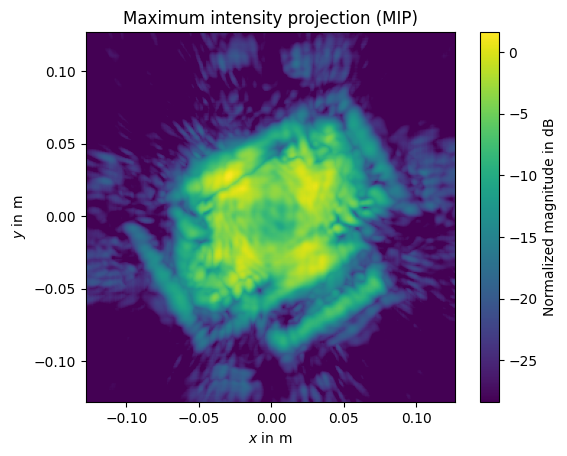

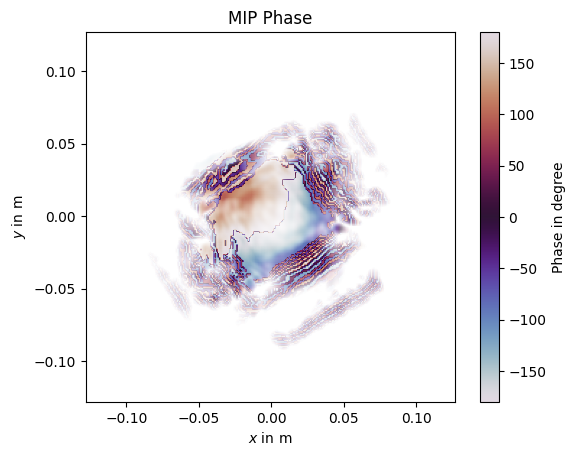

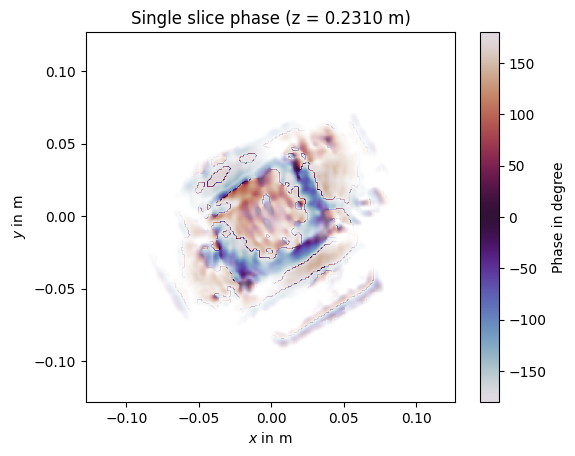

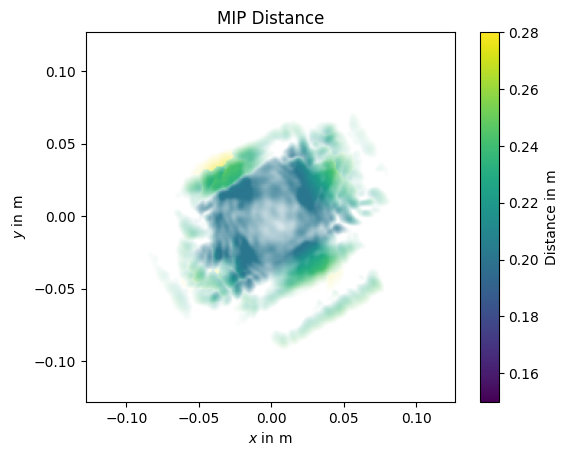

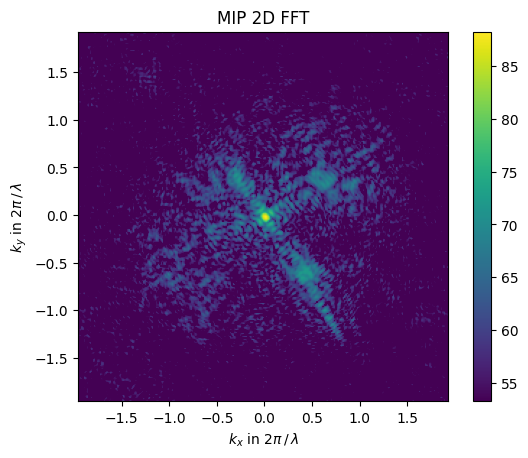

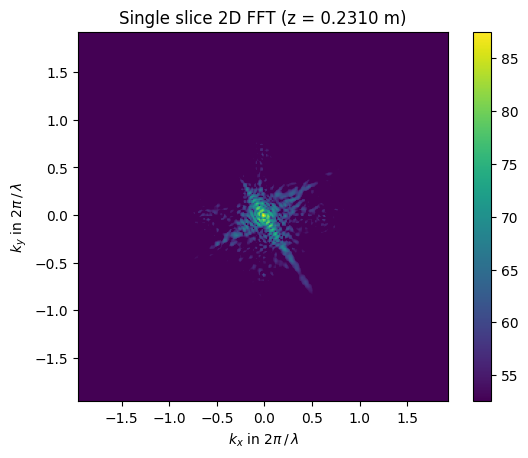

In [3]:
C0 = 299792458
FC = 77e9
LAMBDA = C0 / FC

Z_IDX = 13

volume, x_vec, y_vec, z_vec = import_volume(
    r"starting-kit/volumes/example-1.img"
)

Nx = x_vec.size
Ny = y_vec.size

kx = (np.arange(-Nx / 2, Nx / 2 - 1)) / ((Nx - 1) * np.diff(x_vec[:2]))
ky = (np.arange(-Ny / 2, Ny / 2 - 1)) / ((Ny - 1) * np.diff(y_vec[:2]))

kx_n = kx * LAMBDA
ky_n = ky * LAMBDA

volume_max, kmax = compute_mip(volume)
volume_max_range = (np.min(np.abs(volume_max)), np.max(np.abs(volume_max)))
alpha_data = np.clip(
    1.8 * ((np.abs(volume_max) - volume_max_range[0]) / (volume_max_range[1] - volume_max_range[0])) - 0.25, 0, 1,
)

# 1 --> visualize magnitude of the MIP
image = 20 * np.log10(np.abs(volume_max / np.max(volume_max)))
display(
    image,
    img_title="Maximum intensity projection (MIP)",
    cmap_label="Normalized magnitude in dB",
    xvec=x_vec,
    yvec=y_vec,
    dynamic_range=30,
    xlabel="$x$ in m",
    ylabel="$y$ in m",
)

# 2 --> visualize phase of the MIP (opacity scaled by alpha_data)
_, volume_max_phase = complex2magphase(
    np.multiply(volume_max, np.exp(((1j * 2 * math.pi) / LAMBDA) * 2 * z_vec[kmax]))
)
display(
    180 / math.pi * volume_max_phase,
    color_map=plt.get_cmap("twilight"),
    img_title="MIP Phase",
    cmap_label="Phase in degree",
    alphadata=alpha_data,
    xvec=x_vec,
    yvec=y_vec,
    xlabel="$x$ in m",
    ylabel="$y$ in m",
)

# 3 --> visualize the phase of a selected slice (opacity scaled by alpha_data)
_, V_slice_phase = complex2magphase(volume[:, :, Z_IDX - 1])
display(
    180 / math.pi * V_slice_phase,
    color_map=plt.get_cmap("twilight"),
    img_title=f"Single slice phase (z = {z_vec[Z_IDX - 1]:.4f} m)",
    cmap_label="Phase in degree",
    alphadata=alpha_data,
    xvec=x_vec,
    yvec=y_vec,
    xlabel="$x$ in m",
    ylabel="$y$ in m",
)

# 4 --> visualize the distance of the MIP (opacity scaled by alpha_data)
display(
    z_vec[kmax],
    img_title="MIP Distance",
    cmap_label="Distance in m",
    alphadata=alpha_data,
    xvec=x_vec,
    yvec=y_vec,
    clim=(0.15, 0.28),
    xlabel="$x$ in m",
    ylabel="$y$ in m",
)

# 5 --> visualize the 2D FFT of the MIP
S_MIP = compute_fft(volume_max)
S_MIP_mag_dB = 20 * np.log10(np.abs(S_MIP))
display(
    S_MIP_mag_dB,
    img_title="MIP 2D FFT",
    dynamic_range=35,
    xvec=kx_n,
    yvec=ky_n,
    xlabel="$k_x$ in $2\\pi \\,/\\, \\lambda$",
    ylabel="$k_y$ in $2\\pi \\,/\\, \\lambda$",
)

# 6 --> visualize the 2D FFT of a single slice
S_slice = compute_fft(volume[:, :, Z_IDX - 1])
S_slice_mag_dB = 20 * np.log10(np.abs(S_slice))
display(
    S_slice_mag_dB,
    img_title=f"Single slice 2D FFT (z = {z_vec[Z_IDX - 1]:.4f} m)",
    dynamic_range=35,
    xvec=kx_n,
    yvec=ky_n,
    xlabel="$k_x$ in $2\\pi \\,/\\, \\lambda$",
    ylabel="$k_y$ in $2\\pi \\,/\\, \\lambda$",
)


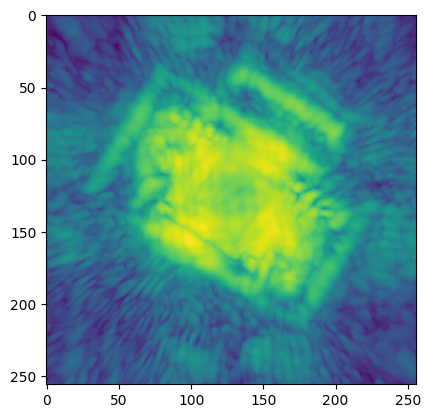

In [5]:
plt.imshow(
            20 * np.log10(np.abs(volume_max / np.max(volume_max)))
        )

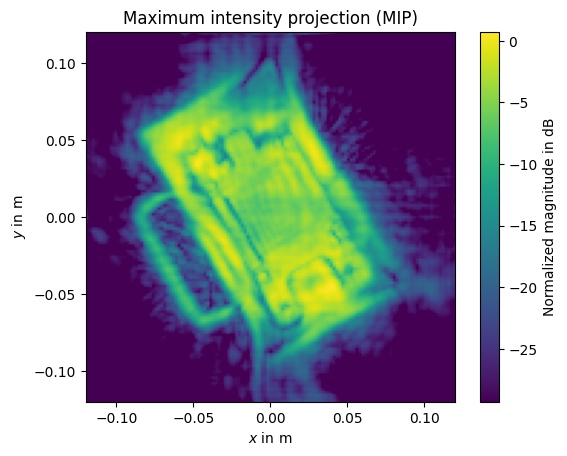

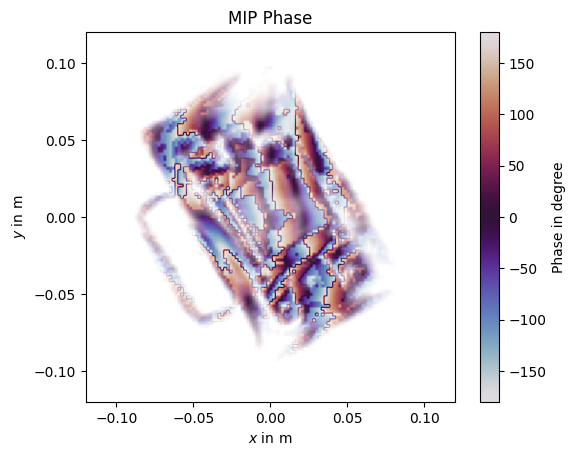

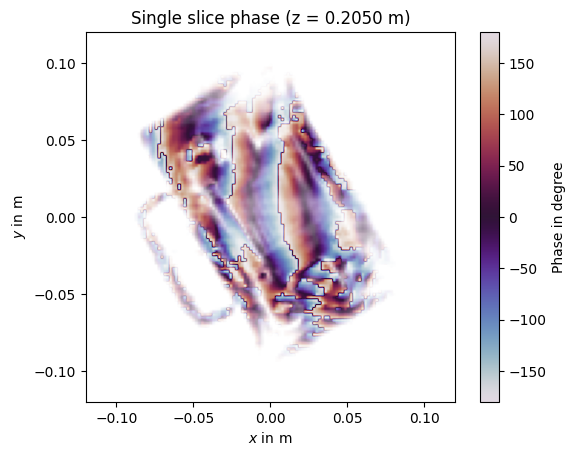

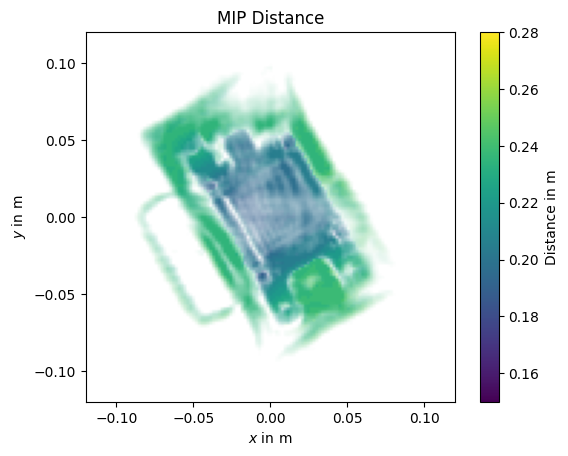

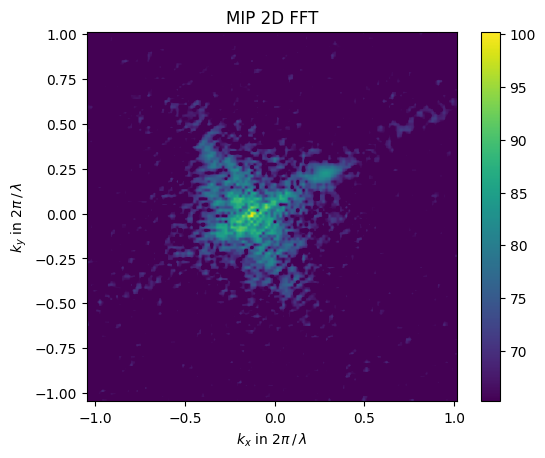

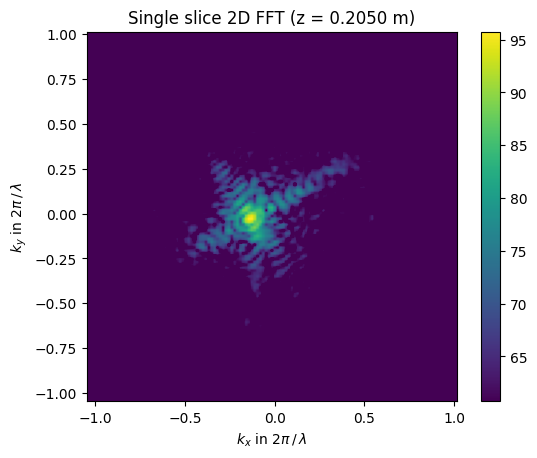

In [6]:
C0 = 299792458
FC = 77e9
LAMBDA = C0 / FC

Z_IDX = 13

volume, x_vec, y_vec, z_vec = import_volume(
    r"radar-task/dummy_measurements/volumes/20221110-104101-918.img"
)

Nx = x_vec.size
Ny = y_vec.size

kx = (np.arange(-Nx / 2, Nx / 2 - 1)) / ((Nx - 1) * np.diff(x_vec[:2]))
ky = (np.arange(-Ny / 2, Ny / 2 - 1)) / ((Ny - 1) * np.diff(y_vec[:2]))

kx_n = kx * LAMBDA
ky_n = ky * LAMBDA

volume_max, kmax = compute_mip(volume)
volume_max_range = (np.min(np.abs(volume_max)), np.max(np.abs(volume_max)))
alpha_data = np.clip(
    1.8 * ((np.abs(volume_max) - volume_max_range[0]) / (volume_max_range[1] - volume_max_range[0])) - 0.25, 0, 1,
)

# 1 --> visualize magnitude of the MIP
image = 20 * np.log10(np.abs(volume_max / np.max(volume_max)))
display(
    image,
    img_title="Maximum intensity projection (MIP)",
    cmap_label="Normalized magnitude in dB",
    xvec=x_vec,
    yvec=y_vec,
    dynamic_range=30,
    xlabel="$x$ in m",
    ylabel="$y$ in m",
)

# 2 --> visualize phase of the MIP (opacity scaled by alpha_data)
_, volume_max_phase = complex2magphase(
    np.multiply(volume_max, np.exp(((1j * 2 * math.pi) / LAMBDA) * 2 * z_vec[kmax]))
)
display(
    180 / math.pi * volume_max_phase,
    color_map=plt.get_cmap("twilight"),
    img_title="MIP Phase",
    cmap_label="Phase in degree",
    alphadata=alpha_data,
    xvec=x_vec,
    yvec=y_vec,
    xlabel="$x$ in m",
    ylabel="$y$ in m",
)

# 3 --> visualize the phase of a selected slice (opacity scaled by alpha_data)
_, V_slice_phase = complex2magphase(volume[:, :, Z_IDX - 1])
display(
    180 / math.pi * V_slice_phase,
    color_map=plt.get_cmap("twilight"),
    img_title=f"Single slice phase (z = {z_vec[Z_IDX - 1]:.4f} m)",
    cmap_label="Phase in degree",
    alphadata=alpha_data,
    xvec=x_vec,
    yvec=y_vec,
    xlabel="$x$ in m",
    ylabel="$y$ in m",
)

# 4 --> visualize the distance of the MIP (opacity scaled by alpha_data)
display(
    z_vec[kmax],
    img_title="MIP Distance",
    cmap_label="Distance in m",
    alphadata=alpha_data,
    xvec=x_vec,
    yvec=y_vec,
    clim=(0.15, 0.28),
    xlabel="$x$ in m",
    ylabel="$y$ in m",
)

# 5 --> visualize the 2D FFT of the MIP
S_MIP = compute_fft(volume_max)
S_MIP_mag_dB = 20 * np.log10(np.abs(S_MIP))
display(
    S_MIP_mag_dB,
    img_title="MIP 2D FFT",
    dynamic_range=35,
    xvec=kx_n,
    yvec=ky_n,
    xlabel="$k_x$ in $2\\pi \\,/\\, \\lambda$",
    ylabel="$k_y$ in $2\\pi \\,/\\, \\lambda$",
)

# 6 --> visualize the 2D FFT of a single slice
S_slice = compute_fft(volume[:, :, Z_IDX - 1])
S_slice_mag_dB = 20 * np.log10(np.abs(S_slice))
display(
    S_slice_mag_dB,
    img_title=f"Single slice 2D FFT (z = {z_vec[Z_IDX - 1]:.4f} m)",
    dynamic_range=35,
    xvec=kx_n,
    yvec=ky_n,
    xlabel="$k_x$ in $2\\pi \\,/\\, \\lambda$",
    ylabel="$k_y$ in $2\\pi \\,/\\, \\lambda$",
)


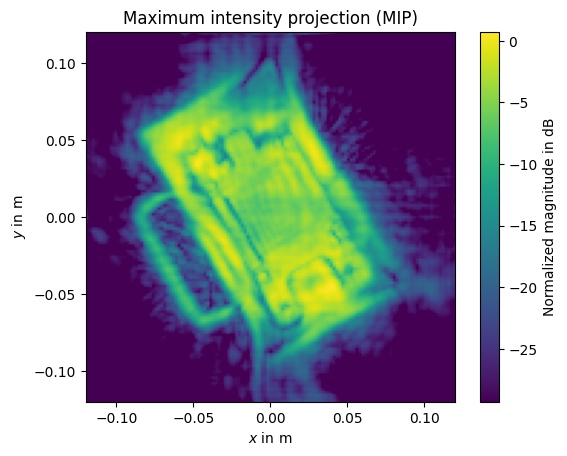

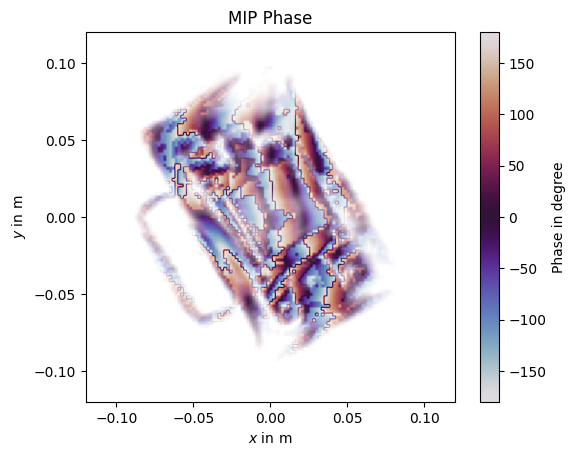

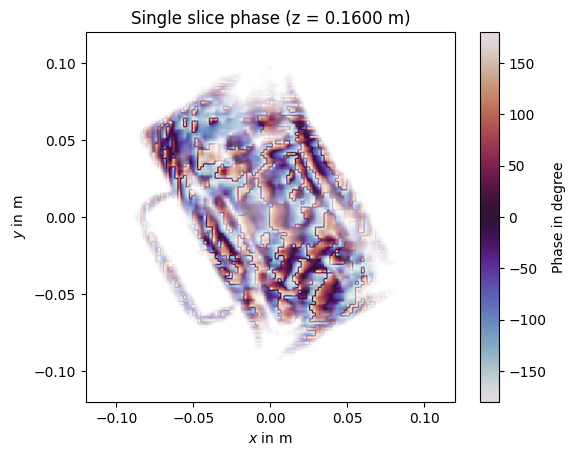

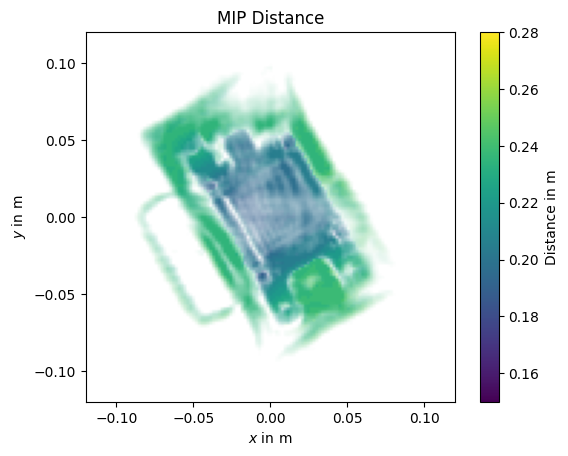

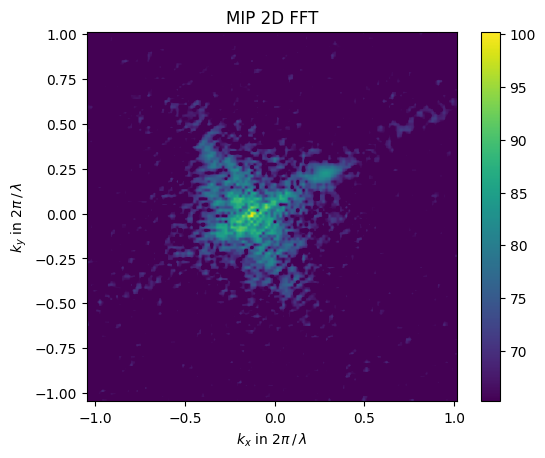

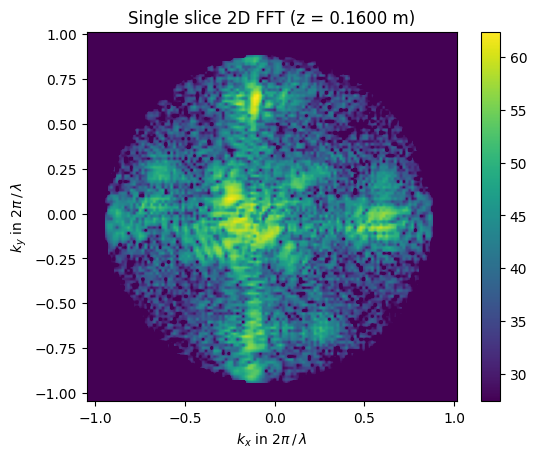

In [8]:
C0 = 299792458
FC = 77e9
LAMBDA = C0 / FC

Z_IDX = 1

volume, x_vec, y_vec, z_vec = import_volume(
    r"radar-task/dummy_measurements/volumes/20221110-104101-918.img"
)

Nx = x_vec.size
Ny = y_vec.size

kx = (np.arange(-Nx / 2, Nx / 2 - 1)) / ((Nx - 1) * np.diff(x_vec[:2]))
ky = (np.arange(-Ny / 2, Ny / 2 - 1)) / ((Ny - 1) * np.diff(y_vec[:2]))

kx_n = kx * LAMBDA
ky_n = ky * LAMBDA

volume_max, kmax = compute_mip(volume)
volume_max_range = (np.min(np.abs(volume_max)), np.max(np.abs(volume_max)))
alpha_data = np.clip(
    1.8 * ((np.abs(volume_max) - volume_max_range[0]) / (volume_max_range[1] - volume_max_range[0])) - 0.25, 0, 1,
)

# 1 --> visualize magnitude of the MIP
image = 20 * np.log10(np.abs(volume_max / np.max(volume_max)))
display(
    image,
    img_title="Maximum intensity projection (MIP)",
    cmap_label="Normalized magnitude in dB",
    xvec=x_vec,
    yvec=y_vec,
    dynamic_range=30,
    xlabel="$x$ in m",
    ylabel="$y$ in m",
)

# 2 --> visualize phase of the MIP (opacity scaled by alpha_data)
_, volume_max_phase = complex2magphase(
    np.multiply(volume_max, np.exp(((1j * 2 * math.pi) / LAMBDA) * 2 * z_vec[kmax]))
)
display(
    180 / math.pi * volume_max_phase,
    color_map=plt.get_cmap("twilight"),
    img_title="MIP Phase",
    cmap_label="Phase in degree",
    alphadata=alpha_data,
    xvec=x_vec,
    yvec=y_vec,
    xlabel="$x$ in m",
    ylabel="$y$ in m",
)

# 3 --> visualize the phase of a selected slice (opacity scaled by alpha_data)
_, V_slice_phase = complex2magphase(volume[:, :, Z_IDX - 1])
display(
    180 / math.pi * V_slice_phase,
    color_map=plt.get_cmap("twilight"),
    img_title=f"Single slice phase (z = {z_vec[Z_IDX - 1]:.4f} m)",
    cmap_label="Phase in degree",
    alphadata=alpha_data,
    xvec=x_vec,
    yvec=y_vec,
    xlabel="$x$ in m",
    ylabel="$y$ in m",
)

# 4 --> visualize the distance of the MIP (opacity scaled by alpha_data)
display(
    z_vec[kmax],
    img_title="MIP Distance",
    cmap_label="Distance in m",
    alphadata=alpha_data,
    xvec=x_vec,
    yvec=y_vec,
    clim=(0.15, 0.28),
    xlabel="$x$ in m",
    ylabel="$y$ in m",
)

# 5 --> visualize the 2D FFT of the MIP
S_MIP = compute_fft(volume_max)
S_MIP_mag_dB = 20 * np.log10(np.abs(S_MIP))
display(
    S_MIP_mag_dB,
    img_title="MIP 2D FFT",
    dynamic_range=35,
    xvec=kx_n,
    yvec=ky_n,
    xlabel="$k_x$ in $2\\pi \\,/\\, \\lambda$",
    ylabel="$k_y$ in $2\\pi \\,/\\, \\lambda$",
)

# 6 --> visualize the 2D FFT of a single slice
S_slice = compute_fft(volume[:, :, Z_IDX - 1])
S_slice_mag_dB = 20 * np.log10(np.abs(S_slice))
display(
    S_slice_mag_dB,
    img_title=f"Single slice 2D FFT (z = {z_vec[Z_IDX - 1]:.4f} m)",
    dynamic_range=35,
    xvec=kx_n,
    yvec=ky_n,
    xlabel="$k_x$ in $2\\pi \\,/\\, \\lambda$",
    ylabel="$k_y$ in $2\\pi \\,/\\, \\lambda$",
)


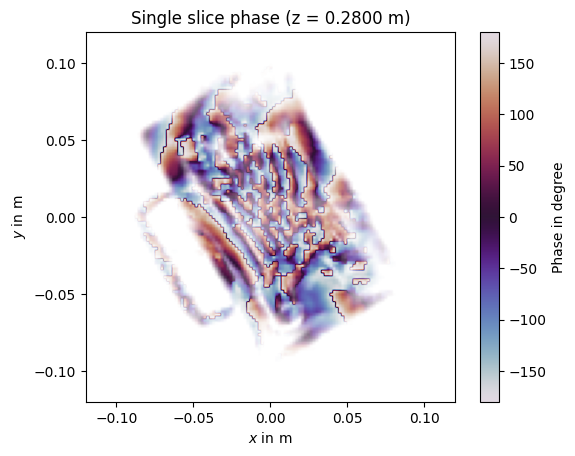

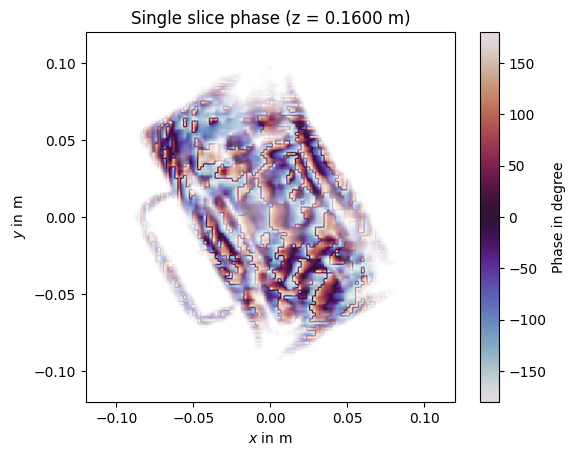

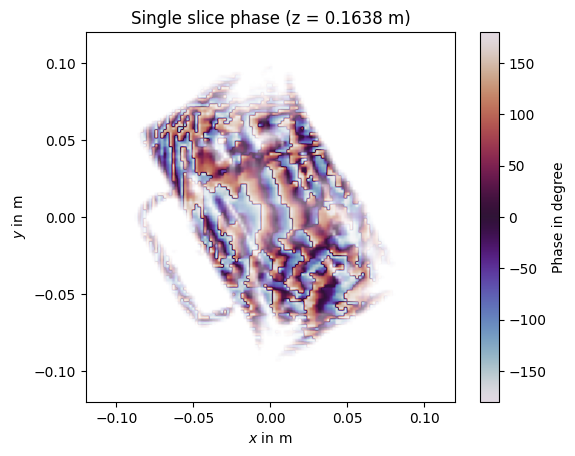

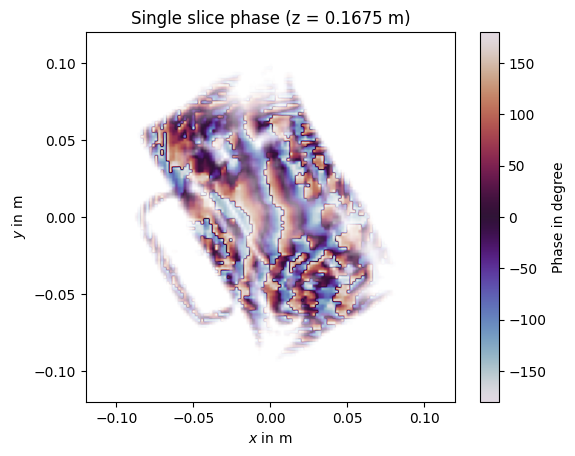

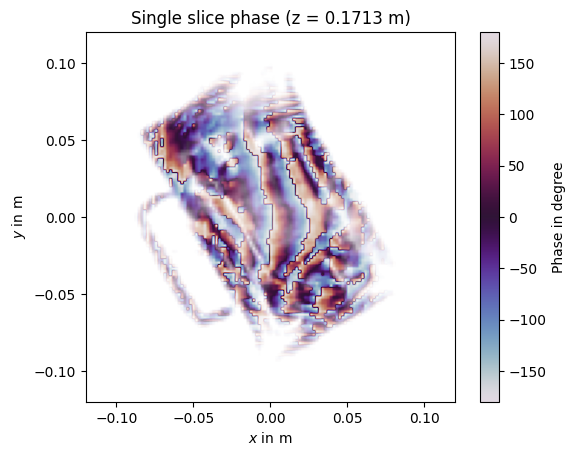

...

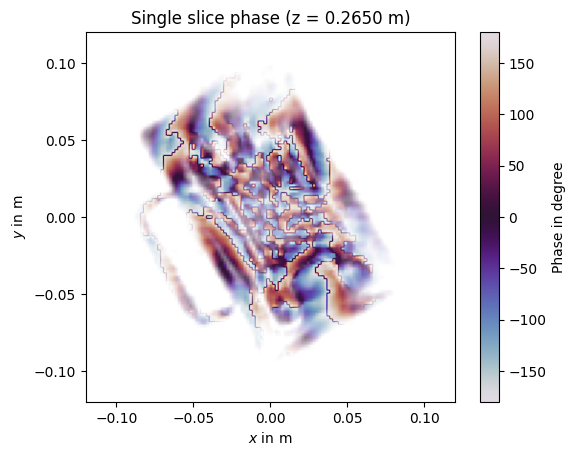

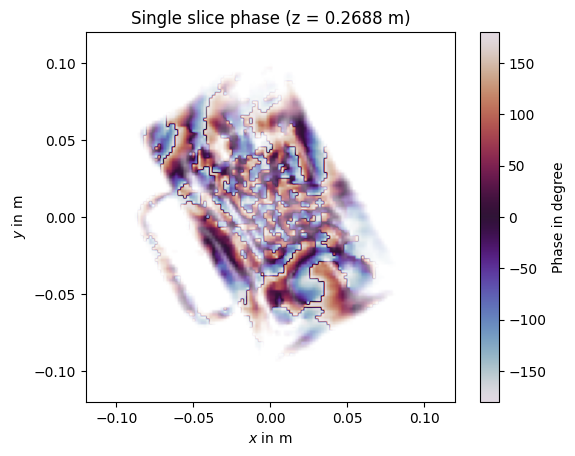

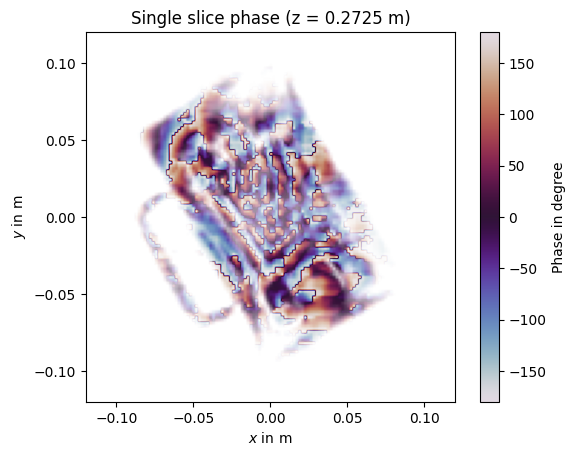

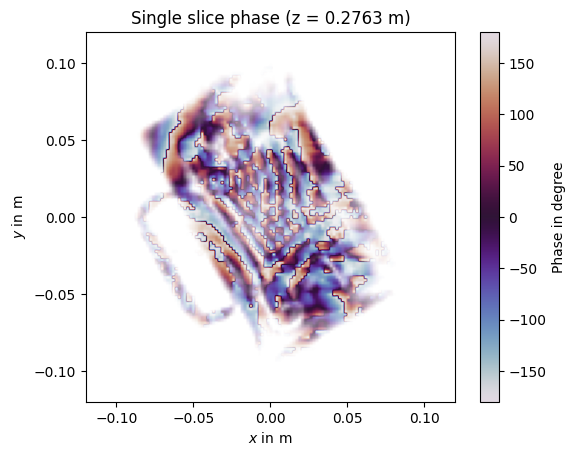

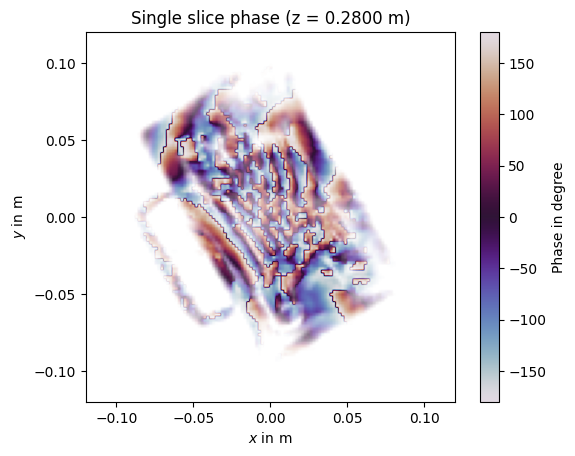

IndexError: index 33 is out of bounds for axis 2 with size 33

In [47]:
C0 = 299792458
FC = 77e9
LAMBDA = C0 / FC

for i in range(100):
    Z_IDX = i

    volume, x_vec, y_vec, z_vec = import_volume(
        r"radar-task/dummy_measurements/volumes/20221110-104101-918.img"
    )

    Nx = x_vec.size
    Ny = y_vec.size

    kx = (np.arange(-Nx / 2, Nx / 2 - 1)) / ((Nx - 1) * np.diff(x_vec[:2]))
    ky = (np.arange(-Ny / 2, Ny / 2 - 1)) / ((Ny - 1) * np.diff(y_vec[:2]))

    kx_n = kx * LAMBDA
    ky_n = ky * LAMBDA

    volume_max, kmax = compute_mip(volume)
    volume_max_range = (np.min(np.abs(volume_max)), np.max(np.abs(volume_max)))
    alpha_data = np.clip(
        1.8 * ((np.abs(volume_max) - volume_max_range[0]) / (volume_max_range[1] - volume_max_range[0])) - 0.25, 0, 1,
    )

    # 3 --> visualize the phase of a selected slice (opacity scaled by alpha_data)
    _, V_slice_phase = complex2magphase(volume[:, :, Z_IDX - 1])
    display(
        180 / math.pi * V_slice_phase,
        color_map=plt.get_cmap("twilight"),
        img_title=f"Single slice phase (z = {z_vec[Z_IDX - 1]:.4f} m)",
        cmap_label="Phase in degree",
        alphadata=alpha_data,
        xvec=x_vec,
        yvec=y_vec,
        xlabel="$x$ in m",
        ylabel="$y$ in m",
    )

In [21]:
volume[:, :, 12 - 1].shape

(129, 129)

In [24]:
volume.shape

(129, 129, 33)

In [17]:
volume[0][0][0]

(-0.22880967-0.105784036j)

In [46]:
volume.shape

(129, 129, 33)

In [23]:
volume

array([[[-2.28809670e-01-1.05784036e-01j,
          2.64212310e-01+2.60276645e-02j,
         -2.88081139e-01+1.98687047e-01j, ...,
          7.53244236e-02-7.38853365e-02j,
          2.24467754e-01-1.06765978e-01j,
         -2.32257798e-01-3.03750336e-01j],
        [-3.40385258e-01-2.48945970e-02j,
         -8.28382671e-02-2.77552992e-01j,
          3.21776748e-01-2.96139531e-03j, ...,
          9.02333409e-02-1.44994169e-01j,
         -2.09722772e-01-1.41729459e-01j,
         -2.84711421e-01+2.26364478e-01j],
        [ 1.11464754e-01+8.75709951e-02j,
         -1.88992411e-01+3.31795961e-02j,
          1.15295179e-01-1.88133836e-01j, ...,
         -1.97506696e-01-3.96625660e-02j,
         -1.19536951e-01+1.79783240e-01j,
          2.02759609e-01+3.72186095e-01j],
        ...,
        [-7.29582459e-02+3.46066710e-03j,
         -6.33192360e-02+6.80999756e-02j,
          4.66300845e-02-2.50997424e-01j, ...,
          4.82370555e-02-3.56480526e-03j,
          5.86296469e-02-1.92560390e-01j

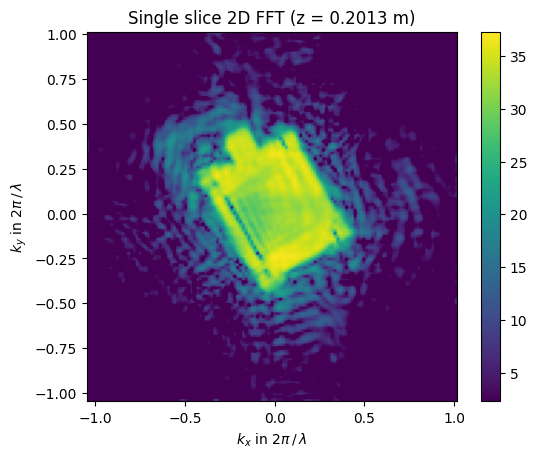

In [29]:
# 6 --> visualize the 2D FFT of a single slice
Z_IDX = 12
S_slice = volume[:, :, Z_IDX - 1]
S_slice_mag_dB = 20 * np.log10(np.abs(S_slice))
display(
    S_slice_mag_dB,
    img_title=f"Single slice 2D FFT (z = {z_vec[Z_IDX - 1]:.4f} m)",
    dynamic_range=35,
    xvec=kx_n,
    yvec=ky_n,
    xlabel="$k_x$ in $2\\pi \\,/\\, \\lambda$",
    ylabel="$k_y$ in $2\\pi \\,/\\, \\lambda$",
)

In [30]:
S_slice

array([[-0.17605227-0.05777294j,  0.2786741 +0.09480548j,
        -0.1303939 -0.21460374j, ...,  0.18535085+0.30607778j,
        -0.07968846+0.28559723j, -0.38425258-0.28266284j],
       [-0.2103224 +0.03547823j, -0.12594903-0.08542315j,
         0.00284063+0.12730019j, ...,  0.21743552-0.16096963j,
        -0.04961402+0.20950042j, -0.17089787+0.33018568j],
       [ 0.12893069+0.30417722j, -0.10818744-0.02169433j,
         0.12538187+0.07395941j, ..., -0.07037432-0.2631982j ,
         0.21316852-0.17538317j,  0.3892615 +0.3717801j ],
       ...,
       [-0.49422827+0.13505588j, -0.12576543+0.17516524j,
         0.277649  +0.2057661j , ..., -0.04413918-0.00686341j,
         0.13582917+0.03603198j, -0.17410873+0.16643733j],
       [-0.06960561-0.38769674j, -0.08659162-0.25219944j,
        -0.32846314+0.23954193j, ..., -0.07356686-0.15953931j,
         0.0291563 +0.03246877j, -0.12134611-0.03292445j],
       [ 0.07835651-0.13133387j,  0.3573687 -0.11743347j,
        -0.3948987 -0.2906303j

In [38]:
#S_slice_mag_dB

In [41]:
np.abs(S_slice)

array([[0.18528928, 0.29435918, 0.2511122 , ..., 0.35782474, 0.29650638,
        0.47702026],
       [0.21329373, 0.152185  , 0.12733188, ..., 0.27053544, 0.21529509,
        0.37179115],
       [0.33037388, 0.11034114, 0.14556994, ..., 0.2724442 , 0.2760436 ,
        0.53827965],
       ...,
       [0.5123492 , 0.21563813, 0.3455845 , ..., 0.04466961, 0.1405271 ,
        0.24086352],
       [0.39389557, 0.26665083, 0.40653214, ..., 0.17568402, 0.0436384 ,
        0.12573344],
       [0.15293244, 0.37616888, 0.49031723, ..., 0.16329451, 0.01696541,
        0.443819  ]], dtype=float32)

In [40]:
S_slice

array([[-0.17605227-0.05777294j,  0.2786741 +0.09480548j,
        -0.1303939 -0.21460374j, ...,  0.18535085+0.30607778j,
        -0.07968846+0.28559723j, -0.38425258-0.28266284j],
       [-0.2103224 +0.03547823j, -0.12594903-0.08542315j,
         0.00284063+0.12730019j, ...,  0.21743552-0.16096963j,
        -0.04961402+0.20950042j, -0.17089787+0.33018568j],
       [ 0.12893069+0.30417722j, -0.10818744-0.02169433j,
         0.12538187+0.07395941j, ..., -0.07037432-0.2631982j ,
         0.21316852-0.17538317j,  0.3892615 +0.3717801j ],
       ...,
       [-0.49422827+0.13505588j, -0.12576543+0.17516524j,
         0.277649  +0.2057661j , ..., -0.04413918-0.00686341j,
         0.13582917+0.03603198j, -0.17410873+0.16643733j],
       [-0.06960561-0.38769674j, -0.08659162-0.25219944j,
        -0.32846314+0.23954193j, ..., -0.07356686-0.15953931j,
         0.0291563 +0.03246877j, -0.12134611-0.03292445j],
       [ 0.07835651-0.13133387j,  0.3573687 -0.11743347j,
        -0.3948987 -0.2906303j

In [44]:
import math
math.sqrt(0.17605227**2 +0.05777294**2)

0.1852892721352116

In [7]:
import json

with open(r"radar-task/dummy_measurements/labels_transformed.json") as f:
    d = json.load(f)
    print(d)

[{'p_pivot': [0.0035947924459209272, 0.004956384911560005, 0.19240547776518577], 'alpha': -0.2707527075, 'beta': -3.068530685, 'gamma': -2.0847849275, 'file': '20221110-104101-918'}, {'p_pivot': [-0.010154882477873734, -0.008602163798682238, 0.19222612929099958], 'alpha': 1.8952689525, 'beta': -3.429534295, 'gamma': 3.79051805, 'file': '20221110-104105-289'}, {'p_pivot': [-0.0006498351171716442, 0.0047770294974572945, 0.18823383353257986], 'alpha': -1.263512635, 'beta': -0.9927599275, 'gamma': 0.379051805, 'file': '20221110-104108-656'}, {'p_pivot': [-0.0022990000197016932, 0.0028486546864188085, 0.1950274837664023], 'alpha': -0.9927599275, 'beta': 0.6317563175, 'gamma': 6.06482888, 'file': '20221110-104111-468'}, {'p_pivot': [0.010387692468741222, -0.0031279050478765134, 0.18823052733431628], 'alpha': 0.6317563175, 'beta': 1.3537635375, 'gamma': -0.9476295125, 'file': '20221110-104114-647'}, {'p_pivot': [-0.016951561832830385, -0.006559547354624733, 0.1916253787022651], 'alpha': -3.97

In [8]:
value_indexes = ["p_pivot_x", "p_pivot_y", "p_pivot_z", "alpha", "beta", "gamma"]
dummy_data = []
dummy_files = []
for each in d:
    temp_arr = []
    dummy_files.append(each["file"])
    temp_arr.append(each["p_pivot"][0])
    temp_arr.append(each["p_pivot"][1])
    temp_arr.append(each["p_pivot"][2])
    temp_arr.append(each["alpha"])
    temp_arr.append(each["beta"])
    temp_arr.append(each["gamma"])
    dummy_data.append(temp_arr)
dummy_data = np.array(dummy_data)
dummy_files = np.array(dummy_files)

In [10]:
import json

with open(r"radar-task/radar_measurements/labels_transformed.json") as f:
    d = json.load(f)
    #print(d)

In [11]:
radar_data = []
radar_files = []
for each in d:
    temp_arr = []
    radar_files.append(each["file"])
    temp_arr.append(each["p_pivot"][0])
    temp_arr.append(each["p_pivot"][1])
    temp_arr.append(each["p_pivot"][2])
    temp_arr.append(each["alpha"])
    temp_arr.append(each["beta"])
    temp_arr.append(each["gamma"])
    radar_data.append(temp_arr)
radar_data = np.array(radar_data)
radar_files = np.array(radar_files)

In [26]:
import plotly.express as px
import pandas as pd

df = pd.DataFrame(dummy_data[:, 0], columns = ["p_pivot_x"])
fig = px.histogram(df, x="p_pivot_x", title="Dummy data p_pivot_x Histogram")
fig.show()

df = pd.DataFrame(radar_data[:, 0], columns = ["p_pivot_x"])
fig = px.histogram(df, x="p_pivot_x", title="Radar data p_pivot_x Histogram")
fig.show()

In [27]:
import plotly.express as px
import pandas as pd

df = pd.DataFrame(dummy_data[:, 1], columns = ["p_pivot_y"])
fig = px.histogram(df, x="p_pivot_y", title="Dummy data p_pivot_y Histogram")
fig.show()

df = pd.DataFrame(radar_data[:, 1], columns = ["p_pivot_y"])
fig = px.histogram(df, x="p_pivot_y", title="Radar data p_pivot_y Histogram")
fig.show()

In [28]:
import plotly.express as px
import pandas as pd

df = pd.DataFrame(dummy_data[:, 2], columns = ["p_pivot_z"])
fig = px.histogram(df, x="p_pivot_z", title="Dummy data p_pivot_z Histogram")
fig.show()

df = pd.DataFrame(radar_data[:, 2], columns = ["p_pivot_z"])
fig = px.histogram(df, x="p_pivot_z", title="Radar data p_pivot_z Histogram")
fig.show()

In [30]:
import plotly.express as px
import pandas as pd

df = pd.DataFrame(dummy_data[:, 3], columns = ["alpha"])
fig = px.histogram(df, x="alpha", title="Dummy data alpha Histogram")
fig.show()

df = pd.DataFrame(radar_data[:, 3], columns = ["alpha"])
fig = px.histogram(df, x="alpha", title="Radar data alpha Histogram")
fig.show()

In [37]:
import plotly.express as px
import pandas as pd

df = pd.DataFrame(dummy_data[:, 4], columns = ["beta"])
fig = px.histogram(df, x="beta", title="Dummy data beta Histogram")
fig.show()

df = pd.DataFrame(radar_data[:, 4], columns = ["beta"])
fig = px.histogram(df, x="beta", title="Radar data beta Histogram")
fig.show()

In [38]:
import plotly.express as px
import pandas as pd

df = pd.DataFrame(dummy_data[:, 5], columns = ["gamma"])
fig = px.histogram(df, x="gamma", title="Dummy data gamma Histogram")
fig.show()

df = pd.DataFrame(radar_data[:, 5], columns = ["gamma"])
fig = px.histogram(df, x="gamma", title="Radar data gamma Histogram")
fig.show()

In [49]:
(dummy_data[:, 3]==radar_data[:, 3]).sum()

1000

In [50]:
(dummy_data[:, 4]==radar_data[:, 4]).sum()

1000

In [51]:
(dummy_data[:, 5]==radar_data[:, 5]).sum()

1000

In [44]:
(dummy_data[:, 0]==radar_data[:, 0]).sum()

1

In [45]:
(dummy_data[:, 1]==radar_data[:, 1]).sum()

1

In [48]:
np.max(dummy_data[:, 0]-radar_data[:, 0])

0.0015115389158515576

In [170]:
max(dummy_data[:, 0])-min(dummy_data[:, 0])

0.03624402510848257

In [69]:
value_indexes

['p_pivot_x', 'p_pivot_y', 'p_pivot_z', 'alpha', 'beta', 'gamma']

In [70]:
dummy_p_pivot_x = np.argsort(dummy_data[:, 0])[[0, -1]]
dummy_files[dummy_p_pivot_x]

array(['20221110-105447-760', '20221110-105114-612'], dtype='<U19')

In [71]:
dummy_p_pivot_x = np.argsort(dummy_data[:, 1])[[0, -1]]
dummy_files[dummy_p_pivot_x]

array(['20221110-104620-330', '20221110-105635-912'], dtype='<U19')

In [74]:
dummy_p_pivot_x = np.argsort(dummy_data[:, 2])[[0, -1]]
dummy_files[dummy_p_pivot_x]

array(['20221110-104542-549', '20221110-105257-809'], dtype='<U19')

In [83]:
dummy_p_pivot_x = np.argsort(dummy_data[:, 3])[[0, -1]]
dummy_files[dummy_p_pivot_x]

array(['20221110-110752-817', '20221110-104800-572'], dtype='<U19')

In [86]:
max(dummy_data[:, 3])-min(dummy_data[:, 3])

16.96716967

In [184]:
LAMBDA

0.0038934085454545454

In [315]:
C0 = 299792458
FC = 77e9
LAMBDA = C0 / FC

Z_IDX = 13

closest_nof_points = 10

def shape_to_pivot_x_calculator(volume_path):
    volume, x_vec, y_vec, z_vec = import_volume(
        volume_path
    )

    Nx = x_vec.size
    Ny = y_vec.size

    kx = (np.arange(-Nx / 2, Nx / 2 - 1)) / ((Nx - 1) * np.diff(x_vec[:2]))
    ky = (np.arange(-Ny / 2, Ny / 2 - 1)) / ((Ny - 1) * np.diff(y_vec[:2]))

    kx_n = kx * LAMBDA
    ky_n = ky * LAMBDA

    volume_max, kmax = compute_mip(volume)
    volume_max_range = (np.min(np.abs(volume_max)), np.max(np.abs(volume_max)))
    alpha_data = np.clip(
        1.8 * ((np.abs(volume_max) - volume_max_range[0]) / (volume_max_range[1] - volume_max_range[0])) - 0.25, 0, 1,
    )

    S_MIP = compute_fft(volume_max)
    S_MIP_mag_dB = 20 * np.log10(np.abs(S_MIP))

    
    maximum_indices = np.dstack(np.unravel_index(np.argsort(S_MIP_mag_dB.ravel()), (S_MIP_mag_dB.shape[0], S_MIP_mag_dB.shape[1])))[0][-closest_nof_points:]
    center_coordinates = maximum_indices.mean(axis=0)
    x_indices = np.round(center_coordinates).astype(int)
    
    return x_vec[x_indices[1]]


In [316]:
for i, file_name in enumerate(dummy_files):
    
    temporary_file_name = f"radar-task/dummy_measurements/volumes/{file_name}.img"
    print(f"file name: {file_name} true value: {dummy_data[:, 0][i]} prediction: {shape_to_pivot_x_calculator(temporary_file_name)}")
    

file name: 20221110-104101-918 true value: 0.0035947924459209272 prediction: -0.011249999999999899
file name: 20221110-104105-289 true value: -0.010154882477873734 prediction: -0.0131249999999999
file name: 20221110-104108-656 true value: -0.0006498351171716442 prediction: -0.0037499999999998923
file name: 20221110-104111-468 true value: -0.0022990000197016932 prediction: 0.0018750000000001127
file name: 20221110-104114-647 true value: 0.010387692468741222 prediction: 0.005625000000000102
file name: 20221110-104118-573 true value: -0.016951561832830385 prediction: 0.007500000000000118
file name: 20221110-104122-500 true value: -0.0019167655158332329 prediction: 0.007500000000000118
file name: 20221110-104125-968 true value: -0.0018887663195783382 prediction: 0.009375000000000133
file name: 20221110-104129-381 true value: 0.0074800607570918035 prediction: -0.005624999999999894
file name: 20221110-104132-846 true value: -0.010043846250192655 prediction: 0.013125000000000109
file name: 20

file name: 20221110-104539-427 true value: -0.005359334703245603 prediction: -0.0037499999999998923
file name: 20221110-104542-549 true value: -0.005311249482939305 prediction: 0.0037500000000001144
file name: 20221110-104545-365 true value: -0.012849548604434798 prediction: 0.024375000000000147
file name: 20221110-104547-855 true value: -0.004782424522774198 prediction: 0.005625000000000102
file name: 20221110-104549-870 true value: -0.0027333084688172847 prediction: 0.0018750000000001127
file name: 20221110-104552-230 true value: 0.0029506833212346656 prediction: -0.0131249999999999
file name: 20221110-104554-612 true value: 0.0033802924049599527 prediction: -0.020624999999999907
file name: 20221110-104557-528 true value: -0.009487213290295107 prediction: 0.037500000000000144
file name: 20221110-104601-953 true value: 0.011512291183371682 prediction: -0.0037499999999998923
file name: 20221110-104605-426 true value: -0.0050198498362178014 prediction: 0.009375000000000133
file name: 20

file name: 20221110-105036-241 true value: 0.00896661151503191 prediction: -0.016874999999999904
file name: 20221110-105038-817 true value: -0.001529179052245804 prediction: -0.0131249999999999
file name: 20221110-105041-831 true value: 0.00021461831253669788 prediction: 0.0018750000000001127
file name: 20221110-105045-408 true value: 0.011275301530211168 prediction: 1.1102230246251565e-16
file name: 20221110-105049-196 true value: -0.007084071134023531 prediction: 0.007500000000000118
file name: 20221110-105052-106 true value: -0.001991394025671744 prediction: 0.0018750000000001127
file name: 20221110-105055-576 true value: -0.008644657075603381 prediction: 0.015000000000000124
file name: 20221110-105058-941 true value: 0.01040462633698229 prediction: -0.016874999999999904
file name: 20221110-105102-401 true value: -0.003916599312135364 prediction: 0.03187500000000015
file name: 20221110-105106-413 true value: -0.0008576850200437934 prediction: -0.0131249999999999
file name: 20221110-

file name: 20221110-105530-194 true value: 0.006832765928258521 prediction: 0.011250000000000121
file name: 20221110-105533-664 true value: -0.005806757716198894 prediction: 1.1102230246251565e-16
file name: 20221110-105536-566 true value: -0.00718414183391355 prediction: 0.007500000000000118
file name: 20221110-105539-832 true value: 0.0032911796414122688 prediction: -0.03374999999999992
file name: 20221110-105543-221 true value: 0.00985009394920811 prediction: -0.007499999999999896
file name: 20221110-105546-126 true value: 0.005187110140944581 prediction: 0.0037500000000001144
file name: 20221110-105549-153 true value: 0.008417581642414981 prediction: 0.0018750000000001127
file name: 20221110-105552-733 true value: -0.001662484653544334 prediction: 0.009375000000000133
file name: 20221110-105556-540 true value: -0.007037172618956558 prediction: 1.1102230246251565e-16
file name: 20221110-105559-987 true value: 0.004240456567900974 prediction: -0.0018749999999998906
file name: 2022111

file name: 20221110-110016-583 true value: 0.005092763390735033 prediction: 0.024375000000000147
file name: 20221110-110020-374 true value: -0.002580991149498972 prediction: 0.01687500000000014
file name: 20221110-110023-519 true value: -0.0046995812997844355 prediction: -0.0037499999999998923
file name: 20221110-110026-772 true value: 0.00034567851384898136 prediction: 0.0018750000000001127
file name: 20221110-110030-152 true value: 0.007949904513585295 prediction: -0.0131249999999999
file name: 20221110-110033-721 true value: 0.0010572780647302962 prediction: -0.0131249999999999
file name: 20221110-110036-433 true value: 0.0005366776428471273 prediction: -0.02437499999999991
file name: 20221110-110039-335 true value: -0.00010889693295410008 prediction: -0.007499999999999896
file name: 20221110-110041-693 true value: -0.007084715577068054 prediction: 0.01687500000000014
file name: 20221110-110044-865 true value: 0.004660094660962698 prediction: 0.0037500000000001144
file name: 2022111

file name: 20221110-110454-034 true value: 8.030336814590026e-05 prediction: -0.0018749999999998906
file name: 20221110-110456-743 true value: -0.006613777845597662 prediction: 0.02250000000000013
file name: 20221110-110459-534 true value: -0.010067292600403694 prediction: 0.028125000000000122
file name: 20221110-110502-665 true value: -0.0015540544651386342 prediction: 0.03187500000000015
file name: 20221110-110505-700 true value: 0.0003184068649298563 prediction: 0.0037500000000001144
file name: 20221110-110508-522 true value: -0.00865027517211157 prediction: 0.020625000000000115
file name: 20221110-110511-315 true value: 0.0017288868058021544 prediction: 0.009375000000000133
file name: 20221110-110514-334 true value: -0.0024652507917598625 prediction: -0.009374999999999897
file name: 20221110-110517-842 true value: -0.001611967162705201 prediction: 0.0037500000000001144
file name: 20221110-110521-544 true value: -0.005393203738061856 prediction: 0.0018750000000001127
file name: 2022

file name: 20221110-110936-974 true value: 0.0012651855447133552 prediction: 0.0018750000000001127
file name: 20221110-110939-663 true value: -0.009263825511815645 prediction: 0.015000000000000124
file name: 20221110-110942-684 true value: 0.005904184519349312 prediction: -0.0018749999999998906
file name: 20221110-110945-905 true value: 0.001673972688224032 prediction: -0.014999999999999902
file name: 20221110-110950-155 true value: -0.00874065348964238 prediction: -0.005624999999999894
file name: 20221110-110953-731 true value: 0.005904502003509345 prediction: 0.0018750000000001127
file name: 20221110-110956-298 true value: 0.006813056345431829 prediction: -0.0018749999999998906
file name: 20221110-110958-971 true value: -0.00091511646327639 prediction: -0.0037499999999998923
file name: 20221110-111002-100 true value: -0.002946142458057338 prediction: -0.0037499999999998923
file name: 20221110-111005-649 true value: -0.0007916528272356748 prediction: 0.015000000000000124
file name: 20

file name: 20221110-111428-338 true value: 0.0028508301737147704 prediction: 1.1102230246251565e-16
file name: 20221110-111431-212 true value: 0.005368207384337799 prediction: -0.011249999999999899
file name: 20221110-111434-211 true value: -0.0007472352926618147 prediction: 0.024375000000000147
file name: 20221110-111437-213 true value: -0.0005574134881577377 prediction: 1.1102230246251565e-16
file name: 20221110-111440-110 true value: 0.0011885101234670363 prediction: 0.018750000000000128
file name: 20221110-111443-131 true value: -0.000497890898631764 prediction: -0.009374999999999897
file name: 20221110-111446-695 true value: 0.0005140429903313381 prediction: 0.005625000000000102
file name: 20221110-111449-603 true value: 0.005696019646547848 prediction: 0.009375000000000133
file name: 20221110-111452-970 true value: -0.006169796986651465 prediction: -0.011249999999999899
file name: 20221110-111456-233 true value: -0.008055361963778719 prediction: -0.0037499999999998923
file name: 

file name: 20221110-111854-932 true value: 0.00415899970960719 prediction: -0.018749999999999906
file name: 20221110-111857-510 true value: -0.005815648036720583 prediction: 0.0037500000000001144
file name: 20221110-111901-292 true value: 0.0012553641673772617 prediction: -0.007499999999999896
file name: 20221110-111904-855 true value: -0.006788345547461164 prediction: 0.005625000000000102
file name: 20221110-111907-542 true value: 0.0023116465977155764 prediction: 0.007500000000000118
file name: 20221110-111910-218 true value: -0.009763776732268945 prediction: 0.007500000000000118
file name: 20221110-111912-891 true value: 0.001060251431435418 prediction: 0.009375000000000133
file name: 20221110-111915-929 true value: -0.00044647284037762107 prediction: -0.0018749999999998906
file name: 20221110-111919-497 true value: -0.0013443860255204433 prediction: 0.018750000000000128
file name: 20221110-111922-948 true value: -0.003486879411500576 prediction: -0.0131249999999999
file name: 20221

file name: 20221110-112346-336 true value: -0.00659794665695676 prediction: 0.011250000000000121
file name: 20221110-112349-795 true value: -0.014246164474395497 prediction: 0.024375000000000147
file name: 20221110-112353-039 true value: -0.007731334666780799 prediction: 1.1102230246251565e-16
file name: 20221110-112356-372 true value: -0.0009409190149740594 prediction: -0.016874999999999904
file name: 20221110-112359-838 true value: -0.011355075593144632 prediction: -0.009374999999999897
file name: 20221110-112403-518 true value: 0.007584125703037511 prediction: 0.005625000000000102
file name: 20221110-112406-971 true value: 0.004800419772364197 prediction: 0.007500000000000118
file name: 20221110-112410-761 true value: -0.00840402553413222 prediction: -0.016874999999999904
file name: 20221110-112414-003 true value: 0.0010376801242415684 prediction: -0.0018749999999998906
file name: 20221110-112416-703 true value: -0.0007004332931367348 prediction: 0.020625000000000115
file name: 2022

file name: 20221110-112814-391 true value: 0.006932588713924551 prediction: -0.009374999999999897
file name: 20221110-112818-503 true value: 0.0038821335658052398 prediction: 1.1102230246251565e-16
file name: 20221110-112822-404 true value: 0.007920955728355798 prediction: -0.009374999999999897
file name: 20221110-112826-306 true value: 0.00888571174978062 prediction: -0.014999999999999902
file name: 20221110-112829-974 true value: 0.004083050312627928 prediction: 0.01687500000000014
file name: 20221110-112833-549 true value: -0.00300439249355471 prediction: 0.028125000000000122
file name: 20221110-112837-538 true value: 0.005138889148641713 prediction: -0.0018749999999998906
file name: 20221110-112841-314 true value: 0.00012841667156082183 prediction: 0.02250000000000013
file name: 20221110-112844-765 true value: 0.008790024338677472 prediction: 0.020625000000000115
file name: 20221110-112848-766 true value: -0.012485510521075598 prediction: 0.01687500000000014
file name: 20221110-112

file name: 20221110-113247-950 true value: 0.0017023876471967923 prediction: 0.03187500000000015
file name: 20221110-113251-514 true value: 0.0030928261726664323 prediction: -0.018749999999999906
file name: 20221110-113255-183 true value: -0.008770145068196419 prediction: 0.015000000000000124
file name: 20221110-113258-528 true value: 0.002783728960875942 prediction: -0.011249999999999899
file name: 20221110-113301-429 true value: 0.003529576187693215 prediction: -0.0131249999999999
file name: 20221110-113304-997 true value: -0.005265934079004808 prediction: 0.018750000000000128
file name: 20221110-113308-994 true value: 0.007769070902841396 prediction: 0.01687500000000014
file name: 20221110-113312-901 true value: 0.0034800779130107922 prediction: -0.014999999999999902
file name: 20221110-113316-151 true value: -0.0023305294289829026 prediction: 0.015000000000000124
file name: 20221110-113319-724 true value: 0.00838430028602075 prediction: -0.02249999999999991
file name: 20221110-1133

In [ ]:
dummy_p_pivot_x = np.argsort(dummy_data[:, 0])[[0, -1]]
dummy_files[dummy_p_pivot_x]

In [307]:
np.argsort(dummy_files=="20221110-105447-760")[-1]

249

In [308]:
dummy_files[249]

'20221110-105447-760'

In [310]:
dummy_data[:, 0][249]

-0.019780670972295192

In [312]:
dummy_files

array(['20221110-104101-918', '20221110-104105-289',
       '20221110-104108-656', '20221110-104111-468',
       '20221110-104114-647', '20221110-104118-573',
       '20221110-104122-500', '20221110-104125-968',
       '20221110-104129-381', '20221110-104132-846',
       '20221110-104136-098', '20221110-104139-790',
       '20221110-104143-143', '20221110-104146-176',
       '20221110-104149-544', '20221110-104152-671',
       '20221110-104155-582', '20221110-104157-848',
       '20221110-104200-090', '20221110-104203-112',
       '20221110-104206-457', '20221110-104209-372',
       '20221110-104211-980', '20221110-104215-224',
       '20221110-104218-817', '20221110-104222-289',
       '20221110-104225-687', '20221110-104229-291',
       '20221110-104233-449', '20221110-104237-477',
       '20221110-104240-204', '20221110-104243-006',
       '20221110-104246-156', '20221110-104249-399',
       '20221110-104252-025', '20221110-104254-931',
       '20221110-104258-288', '20221110-104301

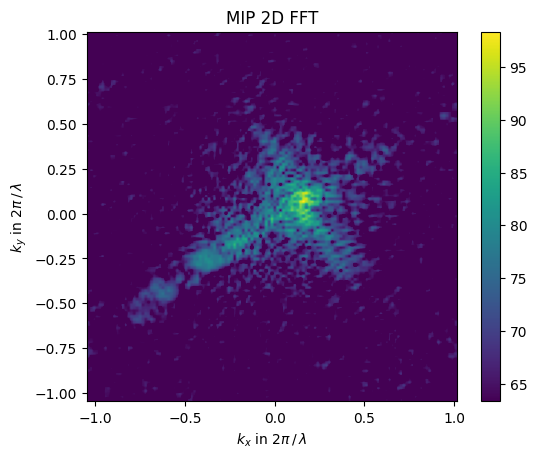

[67.49 73.25]


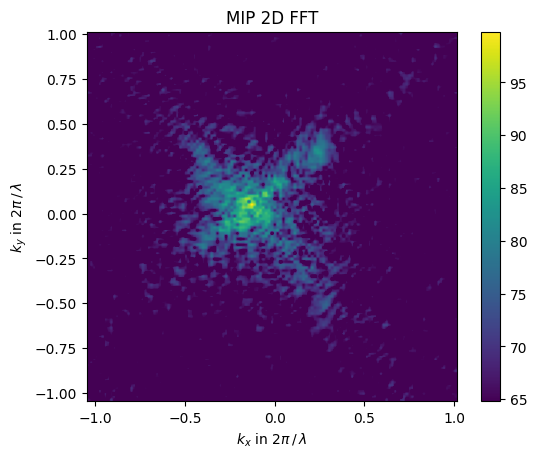

[66.   56.54]


In [132]:
C0 = 299792458
FC = 77e9
LAMBDA = C0 / FC

Z_IDX = 13

volume1, x_vec1, y_vec1, z_vec1 = import_volume(
    r"radar-task/dummy_measurements/volumes/20221110-105447-760.img"
)

volume2, x_vec2, y_vec2, z_vec2 = import_volume(
    r"radar-task/dummy_measurements/volumes/20221110-105114-612.img"
)

Nx1 = x_vec1.size
Ny1 = y_vec1.size

kx1 = (np.arange(-Nx1 / 2, Nx1 / 2 - 1)) / ((Nx1 - 1) * np.diff(x_vec1[:2]))
ky1 = (np.arange(-Ny1 / 2, Ny1 / 2 - 1)) / ((Ny1 - 1) * np.diff(y_vec1[:2]))

kx_n1 = kx1 * LAMBDA
ky_n1 = ky1 * LAMBDA

volume_max1, kmax1 = compute_mip(volume1)
volume_max_range1 = (np.min(np.abs(volume_max1)), np.max(np.abs(volume_max1)))
alpha_data = np.clip(
    1.8 * ((np.abs(volume_max1) - volume_max_range1[0]) / (volume_max_range1[1] - volume_max_range1[0])) - 0.25, 0, 1,
)


# 5 --> visualize the 2D FFT of the MIP
S_MIP1 = compute_fft(volume_max1)
S_MIP_mag_dB1 = 20 * np.log10(np.abs(S_MIP1))
display(
    S_MIP_mag_dB1,
    img_title="MIP 2D FFT",
    dynamic_range=35,
    xvec=kx_n1,
    yvec=ky_n1,
    xlabel="$k_x$ in $2\\pi \\,/\\, \\lambda$",
    ylabel="$k_y$ in $2\\pi \\,/\\, \\lambda$",
)

maximum_indices1 = np.dstack(np.unravel_index(np.argsort(S_MIP_mag_dB1.ravel()), (S_MIP_mag_dB1.shape[0], S_MIP_mag_dB1.shape[1])))[0][-100:]
center_coordinates1 = maximum_indices1.mean(axis=0)
print(center_coordinates1)


Nx2 = x_vec2.size
Ny2 = y_vec2.size

kx2 = (np.arange(-Nx2 / 2, Nx2 / 2 - 1)) / ((Nx2 - 1) * np.diff(x_vec2[:2]))
ky2 = (np.arange(-Ny2 / 2, Ny2 / 2 - 1)) / ((Ny2 - 1) * np.diff(y_vec2[:2]))

kx_n2 = kx2 * LAMBDA
ky_n2 = ky2 * LAMBDA

volume_max2, kmax2 = compute_mip(volume2)
volume_max_range2 = (np.min(np.abs(volume_max2)), np.max(np.abs(volume_max2)))
alpha_data = np.clip(
    1.8 * ((np.abs(volume_max2) - volume_max_range2[0]) / (volume_max_range2[1] - volume_max_range2[0])) - 0.25, 0, 1,
)


# 5 --> visualize the 2D FFT of the MIP
S_MIP2 = compute_fft(volume_max2)
S_MIP_mag_dB2 = 20 * np.log10(np.abs(S_MIP2))
display(
    S_MIP_mag_dB2,
    img_title="MIP 2D FFT",
    dynamic_range=35,
    xvec=kx_n2,
    yvec=ky_n2,
    xlabel="$k_x$ in $2\\pi \\,/\\, \\lambda$",
    ylabel="$k_y$ in $2\\pi \\,/\\, \\lambda$",
)

maximum_indices2 = np.dstack(np.unravel_index(np.argsort(S_MIP_mag_dB2.ravel()), (S_MIP_mag_dB2.shape[0], S_MIP_mag_dB2.shape[1])))[0][-100:]
center_coordinates2 = maximum_indices2.mean(axis=0)
print(center_coordinates2)

In [294]:
closest_nof_points = 10

In [299]:
maximum_indices2 = np.dstack(np.unravel_index(np.argsort(S_MIP_mag_dB2.ravel()), (S_MIP_mag_dB2.shape[0], S_MIP_mag_dB2.shape[1])))[0][-closest_nof_points:]
center_coordinates2 = maximum_indices2.mean(axis=0)
x_indices2 = np.round(center_coordinates2).astype(int)
x_vec2[x_indices2[1]]

-0.014999999999999902

In [300]:
maximum_indices1 = np.dstack(np.unravel_index(np.argsort(S_MIP_mag_dB1.ravel()), (S_MIP_mag_dB1.shape[0], S_MIP_mag_dB1.shape[1])))[0][-closest_nof_points:]
center_coordinates1 = maximum_indices1.mean(axis=0)
x_indices1 = np.round(center_coordinates1).astype(int)
x_vec1[x_indices1[1]]

0.020625000000000115

In [301]:
print(abs(x_vec2[x_indices2[1]]-x_vec1[x_indices1[1]]))

0.03562500000000002


In [302]:
0.03624402510848257

0.03624402510848257

In [147]:
np.dstack(np.unravel_index(np.argsort(S_MIP_mag_dB1.ravel()), (S_MIP_mag_dB1.shape[0], S_MIP_mag_dB1.shape[1])))[0][-10:]

array([[69, 78],
       [68, 74],
       [71, 75],
       [69, 76],
       [70, 75],
       [70, 76],
       [72, 75],
       [69, 74],
       [72, 76],
       [69, 75]], dtype=int64)

In [148]:
np.dstack(np.unravel_index(np.argsort(S_MIP_mag_dB2.ravel()), (S_MIP_mag_dB2.shape[0], S_MIP_mag_dB2.shape[1])))[0][-10:]

array([[69, 55],
       [69, 57],
       [67, 54],
       [67, 56],
       [70, 56],
       [68, 56],
       [68, 58],
       [70, 55],
       [67, 57],
       [68, 57]], dtype=int64)

In [165]:
S_MIP_mag_dB2[68, 57]

99.80824428810699

In [166]:
S_MIP_mag_dB2[68, 75]

61.16940732009976

In [142]:
kx1

array([-268.75      , -264.58333333, -260.41666667, -256.25      ,
       -252.08333333, -247.91666667, -243.75      , -239.58333333,
       -235.41666667, -231.25      , -227.08333333, -222.91666667,
       -218.75      , -214.58333333, -210.41666667, -206.25      ,
       -202.08333333, -197.91666667, -193.75      , -189.58333333,
       -185.41666667, -181.25      , -177.08333333, -172.91666667,
       -168.75      , -164.58333333, -160.41666667, -156.25      ,
       -152.08333333, -147.91666667, -143.75      , -139.58333333,
       -135.41666667, -131.25      , -127.08333333, -122.91666667,
       -118.75      , -114.58333333, -110.41666667, -106.25      ,
       -102.08333333,  -97.91666667,  -93.75      ,  -89.58333333,
        -85.41666667,  -81.25      ,  -77.08333333,  -72.91666667,
        -68.75      ,  -64.58333333,  -60.41666667,  -56.25      ,
        -52.08333333,  -47.91666667,  -43.75      ,  -39.58333333,
        -35.41666667,  -31.25      ,  -27.08333333,  -22.91666

In [108]:
maximum_indices

array([[68, 48],
       [59, 46],
       [65, 52],
       [65, 63],
       [60, 51],
       [60, 49],
       [63, 63],
       [64, 52],
       [66, 62],
       [65, 57],
       [62, 62],
       [61, 55],
       [59, 53],
       [67, 60],
       [62, 51],
       [75, 66],
       [72, 52],
       [73, 50],
       [70, 60],
       [65, 61],
       [64, 54],
       [68, 52],
       [75, 67],
       [61, 54],
       [76, 65],
       [60, 55],
       [66, 63],
       [67, 58],
       [67, 59],
       [63, 60],
       [73, 64],
       [71, 63],
       [64, 61],
       [63, 62],
       [61, 56],
       [63, 61],
       [66, 53],
       [62, 59],
       [61, 48],
       [64, 63],
       [64, 62],
       [62, 56],
       [61, 49],
       [62, 63],
       [62, 49],
       [66, 59],
       [67, 53],
       [60, 54],
       [60, 53],
       [64, 58],
       [69, 60],
       [62, 52],
       [70, 53],
       [62, 48],
       [69, 52],
       [65, 62],
       [63, 51],
       [68, 55],
       [67, 61

In [345]:
def visualize_all(volume_path): 
    C0 = 299792458
    FC = 77e9
    LAMBDA = C0 / FC

    Z_IDX = 13

    volume, x_vec, y_vec, z_vec = import_volume(
        volume_path
    )

    Nx = x_vec.size
    Ny = y_vec.size

    kx = (np.arange(-Nx / 2, Nx / 2 - 1)) / ((Nx - 1) * np.diff(x_vec[:2]))
    ky = (np.arange(-Ny / 2, Ny / 2 - 1)) / ((Ny - 1) * np.diff(y_vec[:2]))

    kx_n = kx * LAMBDA
    ky_n = ky * LAMBDA

    volume_max, kmax = compute_mip(volume)
    volume_max_range = (np.min(np.abs(volume_max)), np.max(np.abs(volume_max)))
    alpha_data = np.clip(
        1.8 * ((np.abs(volume_max) - volume_max_range[0]) / (volume_max_range[1] - volume_max_range[0])) - 0.25, 0, 1,
    )

    # 1 --> visualize magnitude of the MIP
    image = 20 * np.log10(np.abs(volume_max / np.max(volume_max)))
    display(
        image,
        img_title="Maximum intensity projection (MIP)",
        cmap_label="Normalized magnitude in dB",
        xvec=x_vec,
        yvec=y_vec,
        dynamic_range=30,
        xlabel="$x$ in m",
        ylabel="$y$ in m",
    )

    # 2 --> visualize phase of the MIP (opacity scaled by alpha_data)
    _, volume_max_phase = complex2magphase(
        np.multiply(volume_max, np.exp(((1j * 2 * math.pi) / LAMBDA) * 2 * z_vec[kmax]))
    )
    display(
        180 / math.pi * volume_max_phase,
        color_map=plt.get_cmap("twilight"),
        img_title="MIP Phase",
        cmap_label="Phase in degree",
        alphadata=alpha_data,
        xvec=x_vec,
        yvec=y_vec,
        xlabel="$x$ in m",
        ylabel="$y$ in m",
    )

    # 3 --> visualize the phase of a selected slice (opacity scaled by alpha_data)
    _, V_slice_phase = complex2magphase(volume[:, :, Z_IDX - 1])
    display(
        180 / math.pi * V_slice_phase,
        color_map=plt.get_cmap("twilight"),
        img_title=f"Single slice phase (z = {z_vec[Z_IDX - 1]:.4f} m)",
        cmap_label="Phase in degree",
        alphadata=alpha_data,
        xvec=x_vec,
        yvec=y_vec,
        xlabel="$x$ in m",
        ylabel="$y$ in m",
    )

    # 4 --> visualize the distance of the MIP (opacity scaled by alpha_data)
    display(
        z_vec[kmax],
        img_title="MIP Distance",
        cmap_label="Distance in m",
        alphadata=alpha_data,
        xvec=x_vec,
        yvec=y_vec,
        clim=(0.15, 0.28),
        xlabel="$x$ in m",
        ylabel="$y$ in m",
    )

    # 5 --> visualize the 2D FFT of the MIP
    S_MIP = compute_fft(volume_max)
    S_MIP_mag_dB = 20 * np.log10(np.abs(S_MIP))
    display(
        S_MIP_mag_dB,
        img_title="MIP 2D FFT",
        dynamic_range=35,
        xvec=kx_n,
        yvec=ky_n,
        xlabel="$k_x$ in $2\\pi \\,/\\, \\lambda$",
        ylabel="$k_y$ in $2\\pi \\,/\\, \\lambda$",
    )

    # 6 --> visualize the 2D FFT of a single slice
    S_slice = compute_fft(volume[:, :, Z_IDX - 1])
    S_slice_mag_dB = 20 * np.log10(np.abs(S_slice))
    display(
        S_slice_mag_dB,
        img_title=f"Single slice 2D FFT (z = {z_vec[Z_IDX - 1]:.4f} m)",
        dynamic_range=35,
        xvec=kx_n,
        yvec=ky_n,
        xlabel="$k_x$ in $2\\pi \\,/\\, \\lambda$",
        ylabel="$k_y$ in $2\\pi \\,/\\, \\lambda$",
    )


In [338]:
value_indexes

['p_pivot_x', 'p_pivot_y', 'p_pivot_z', 'alpha', 'beta', 'gamma']

In [339]:
dummy_p_pivot_x = np.argsort(dummy_data[:, 0])[[0, -1]]
dummy_files[dummy_p_pivot_x]

array(['20221110-105447-760', '20221110-105114-612'], dtype='<U19')

In [340]:
dummy_p_pivot_x = np.argsort(dummy_data[:, 1])[[0, -1]]
dummy_files[dummy_p_pivot_x]

array(['20221110-104620-330', '20221110-105635-912'], dtype='<U19')

In [341]:
dummy_p_pivot_x = np.argsort(dummy_data[:, 2])[[0, -1]]
dummy_files[dummy_p_pivot_x]

array(['20221110-104542-549', '20221110-105257-809'], dtype='<U19')

In [342]:
dummy_p_pivot_x = np.argsort(dummy_data[:, 3])[[0, -1]]
dummy_files[dummy_p_pivot_x]

array(['20221110-110752-817', '20221110-104800-572'], dtype='<U19')

In [ ]:
r"radar-task/dummy_measurements/volumes/20221110-110752-817.img"

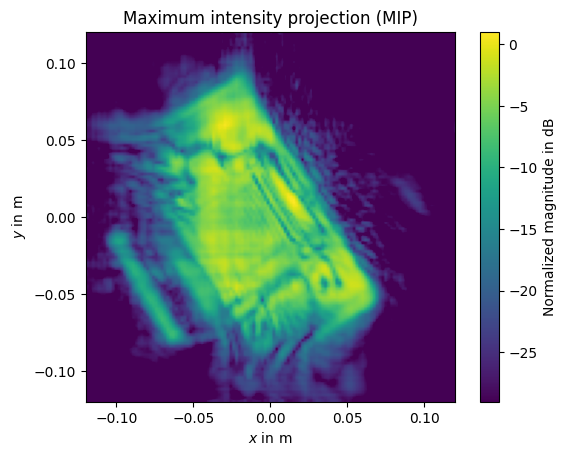

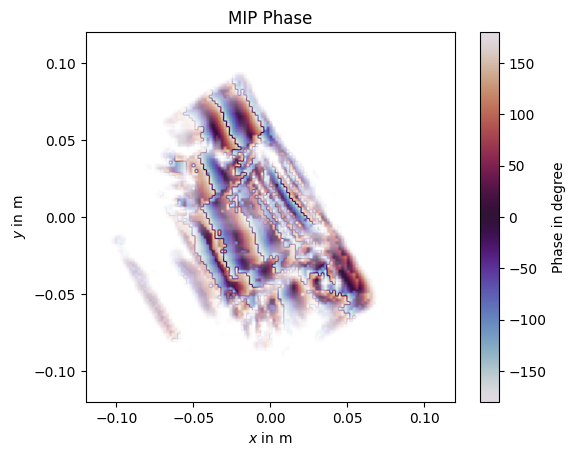

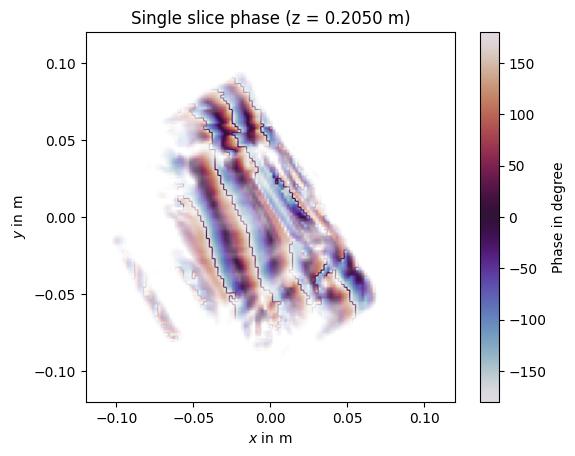

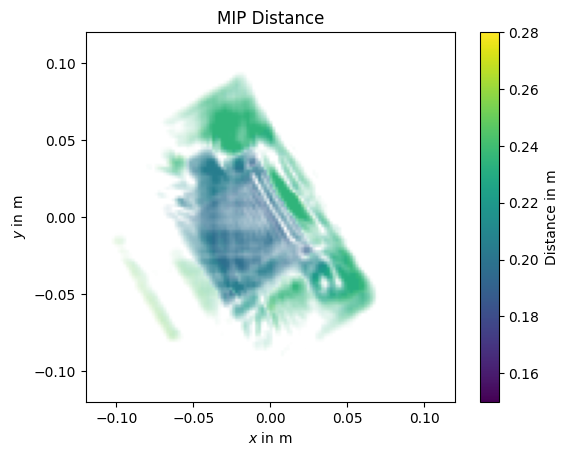

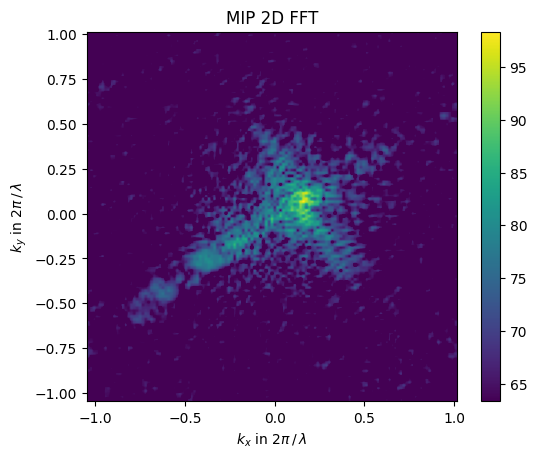

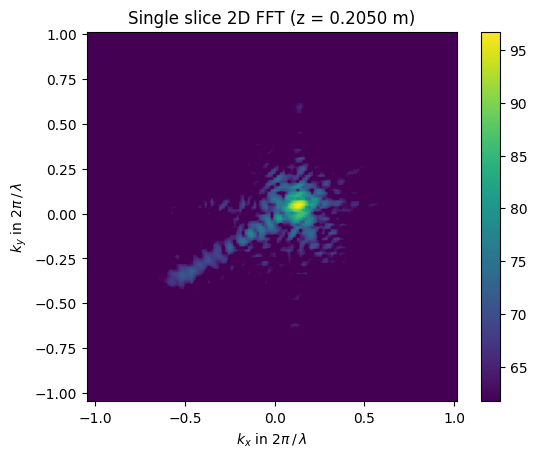

In [346]:
visualize_all(r"radar-task/dummy_measurements/volumes/20221110-105447-760.img")

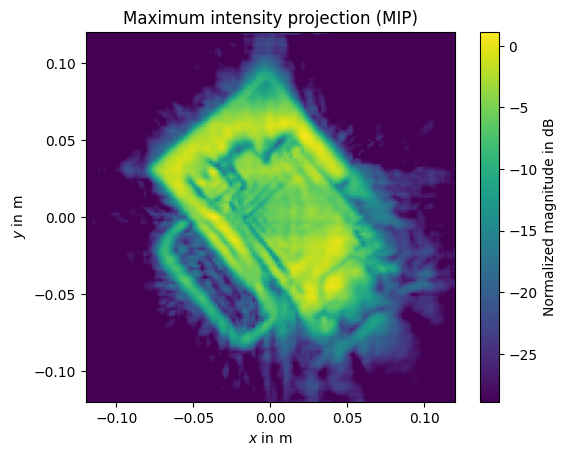

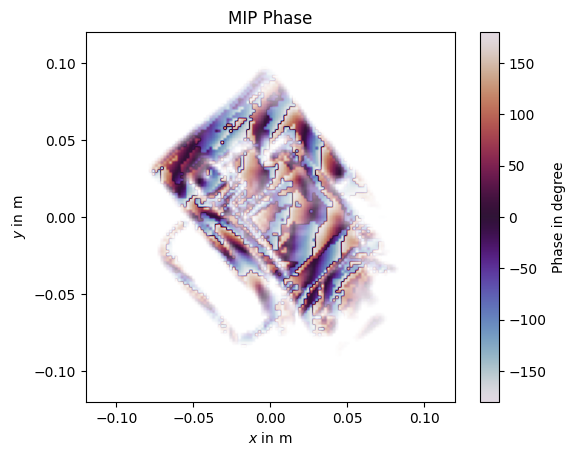

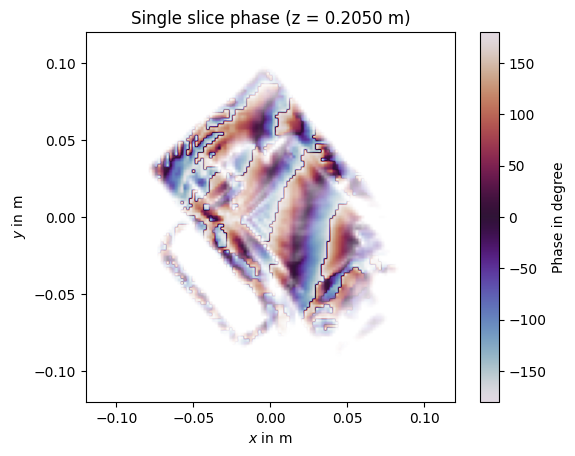

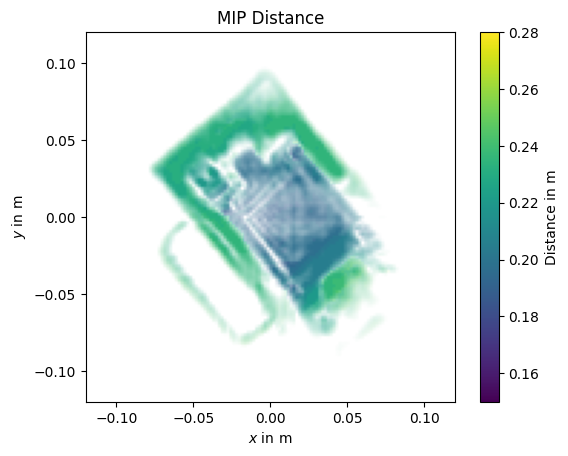

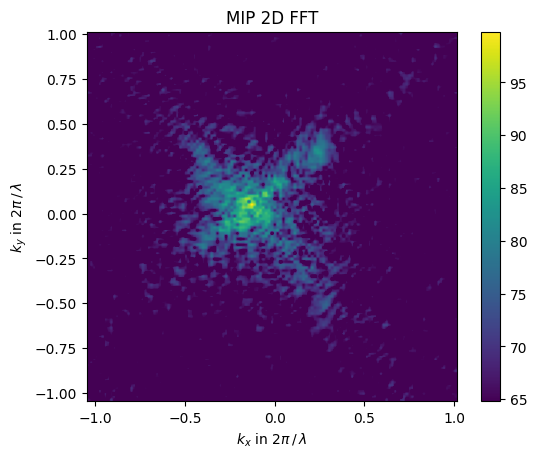

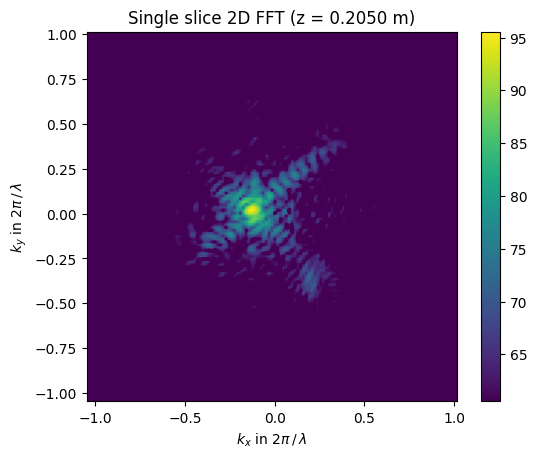

In [347]:
visualize_all(r"radar-task/dummy_measurements/volumes/20221110-105114-612.img")

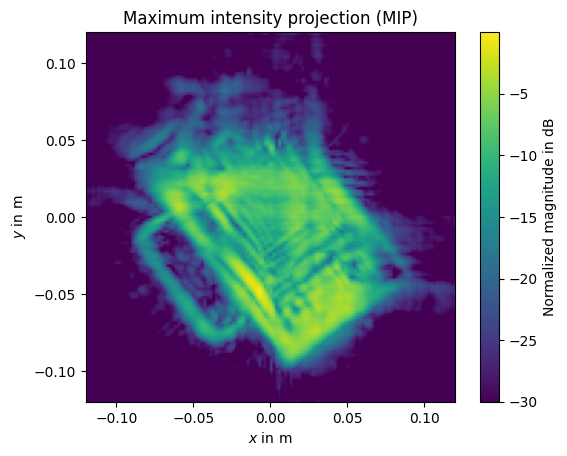

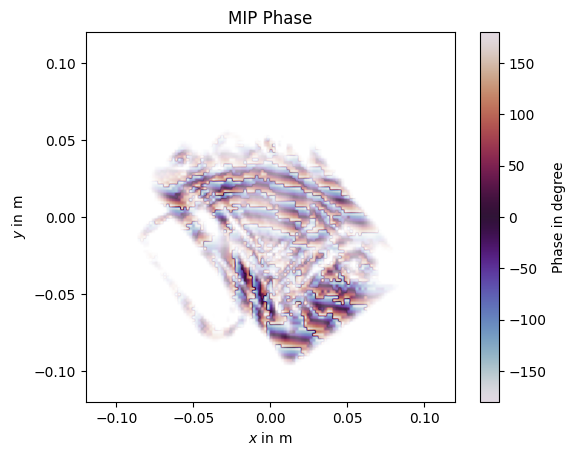

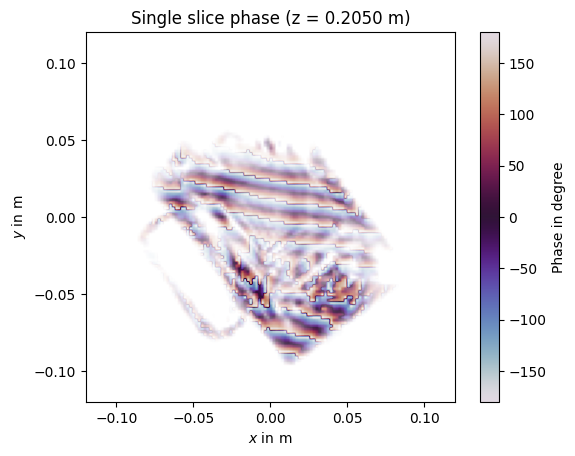

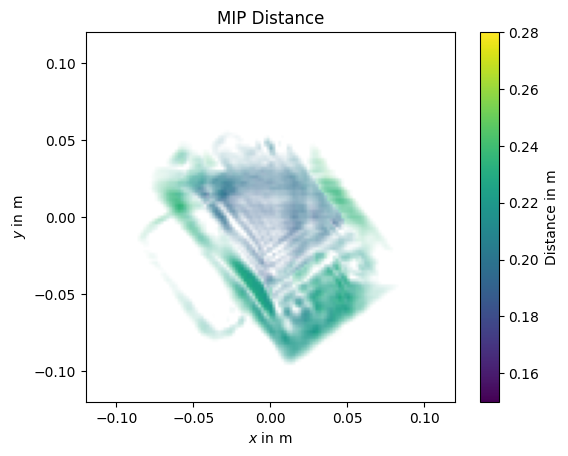

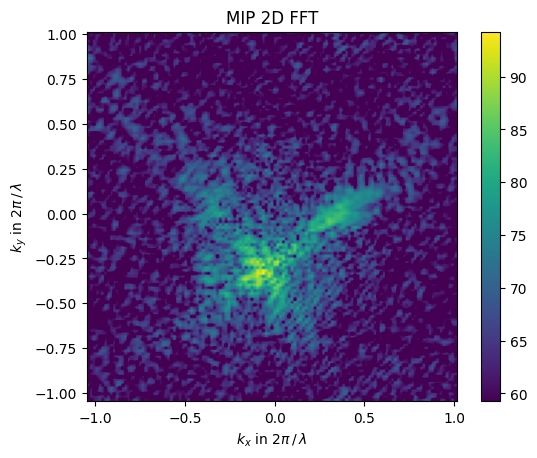

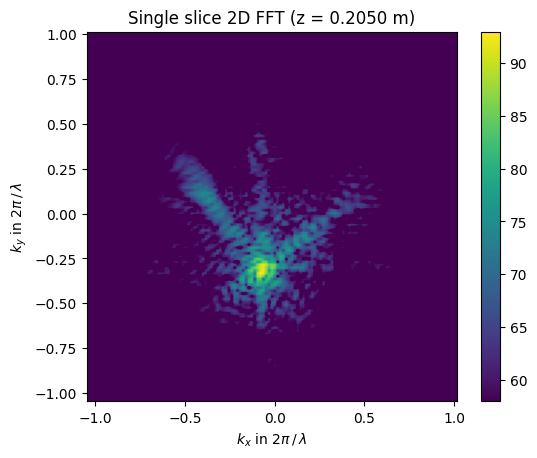

In [85]:
C0 = 299792458
FC = 77e9
LAMBDA = C0 / FC

Z_IDX = 13

volume, x_vec, y_vec, z_vec = import_volume(
    r"radar-task/dummy_measurements/volumes/20221110-104800-572.img"
)

Nx = x_vec.size
Ny = y_vec.size

kx = (np.arange(-Nx / 2, Nx / 2 - 1)) / ((Nx - 1) * np.diff(x_vec[:2]))
ky = (np.arange(-Ny / 2, Ny / 2 - 1)) / ((Ny - 1) * np.diff(y_vec[:2]))

kx_n = kx * LAMBDA
ky_n = ky * LAMBDA

volume_max, kmax = compute_mip(volume)
volume_max_range = (np.min(np.abs(volume_max)), np.max(np.abs(volume_max)))
alpha_data = np.clip(
    1.8 * ((np.abs(volume_max) - volume_max_range[0]) / (volume_max_range[1] - volume_max_range[0])) - 0.25, 0, 1,
)

# 1 --> visualize magnitude of the MIP
image = 20 * np.log10(np.abs(volume_max / np.max(volume_max)))
display(
    image,
    img_title="Maximum intensity projection (MIP)",
    cmap_label="Normalized magnitude in dB",
    xvec=x_vec,
    yvec=y_vec,
    dynamic_range=30,
    xlabel="$x$ in m",
    ylabel="$y$ in m",
)

# 2 --> visualize phase of the MIP (opacity scaled by alpha_data)
_, volume_max_phase = complex2magphase(
    np.multiply(volume_max, np.exp(((1j * 2 * math.pi) / LAMBDA) * 2 * z_vec[kmax]))
)
display(
    180 / math.pi * volume_max_phase,
    color_map=plt.get_cmap("twilight"),
    img_title="MIP Phase",
    cmap_label="Phase in degree",
    alphadata=alpha_data,
    xvec=x_vec,
    yvec=y_vec,
    xlabel="$x$ in m",
    ylabel="$y$ in m",
)

# 3 --> visualize the phase of a selected slice (opacity scaled by alpha_data)
_, V_slice_phase = complex2magphase(volume[:, :, Z_IDX - 1])
display(
    180 / math.pi * V_slice_phase,
    color_map=plt.get_cmap("twilight"),
    img_title=f"Single slice phase (z = {z_vec[Z_IDX - 1]:.4f} m)",
    cmap_label="Phase in degree",
    alphadata=alpha_data,
    xvec=x_vec,
    yvec=y_vec,
    xlabel="$x$ in m",
    ylabel="$y$ in m",
)

# 4 --> visualize the distance of the MIP (opacity scaled by alpha_data)
display(
    z_vec[kmax],
    img_title="MIP Distance",
    cmap_label="Distance in m",
    alphadata=alpha_data,
    xvec=x_vec,
    yvec=y_vec,
    clim=(0.15, 0.28),
    xlabel="$x$ in m",
    ylabel="$y$ in m",
)

# 5 --> visualize the 2D FFT of the MIP
S_MIP = compute_fft(volume_max)
S_MIP_mag_dB = 20 * np.log10(np.abs(S_MIP))
display(
    S_MIP_mag_dB,
    img_title="MIP 2D FFT",
    dynamic_range=35,
    xvec=kx_n,
    yvec=ky_n,
    xlabel="$k_x$ in $2\\pi \\,/\\, \\lambda$",
    ylabel="$k_y$ in $2\\pi \\,/\\, \\lambda$",
)

# 6 --> visualize the 2D FFT of a single slice
S_slice = compute_fft(volume[:, :, Z_IDX - 1])
S_slice_mag_dB = 20 * np.log10(np.abs(S_slice))
display(
    S_slice_mag_dB,
    img_title=f"Single slice 2D FFT (z = {z_vec[Z_IDX - 1]:.4f} m)",
    dynamic_range=35,
    xvec=kx_n,
    yvec=ky_n,
    xlabel="$k_x$ in $2\\pi \\,/\\, \\lambda$",
    ylabel="$k_y$ in $2\\pi \\,/\\, \\lambda$",
)


In [82]:
z_vec[kmax]

array([[0.21625, 0.21625, 0.16375, ..., 0.22375, 0.23125, 0.22375],
       [0.205  , 0.16   , 0.235  , ..., 0.23125, 0.23125, 0.22   ],
       [0.21625, 0.235  , 0.235  , ..., 0.235  , 0.235  , 0.22   ],
       ...,
       [0.21625, 0.2125 , 0.2125 , ..., 0.2275 , 0.2275 , 0.22375],
       [0.2125 , 0.21625, 0.21625, ..., 0.2275 , 0.2275 , 0.2275 ],
       [0.22   , 0.22   , 0.21625, ..., 0.235  , 0.1975 , 0.23125]])

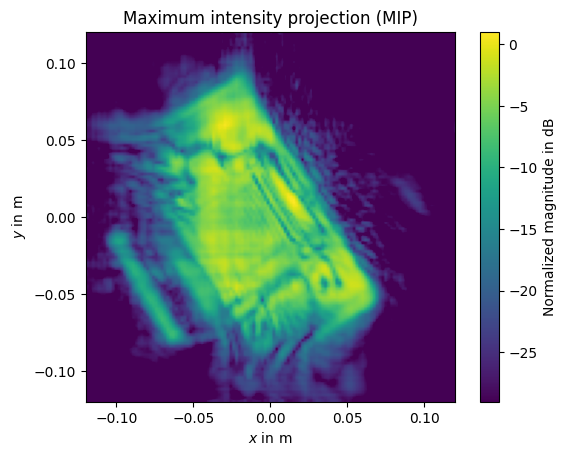

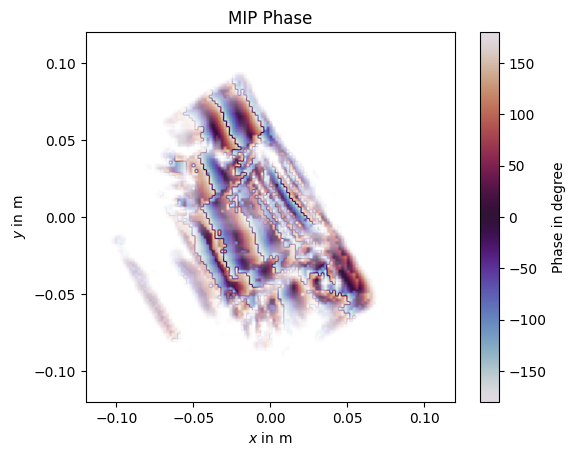

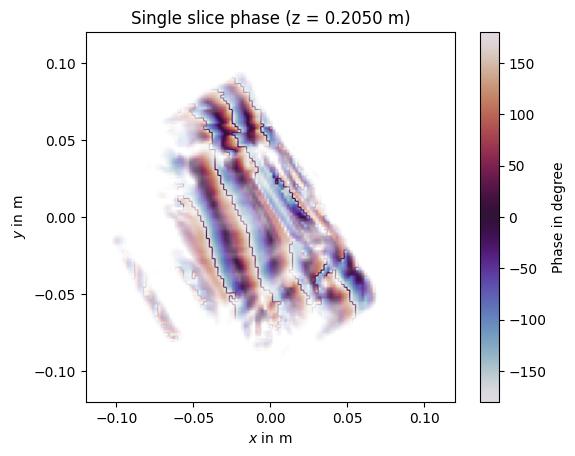

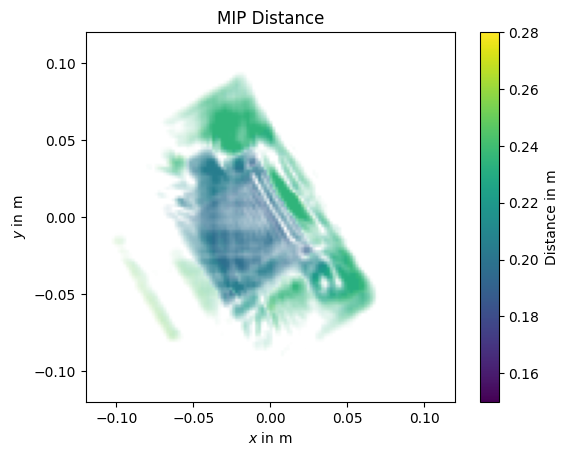

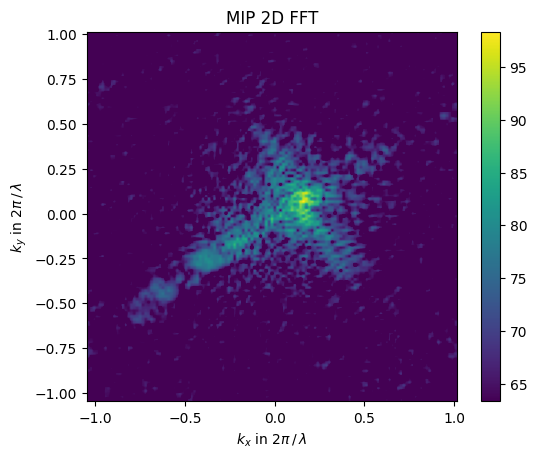

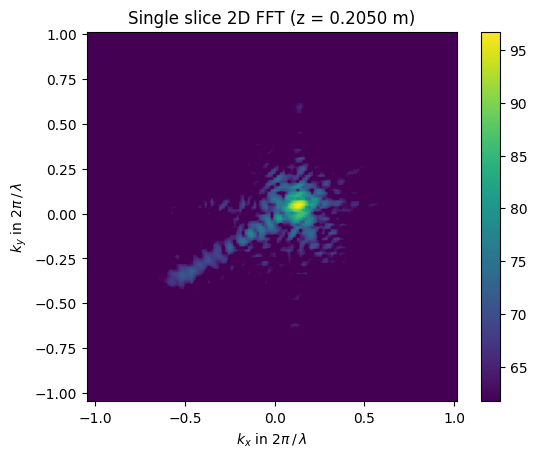

In [317]:
C0 = 299792458
FC = 77e9
LAMBDA = C0 / FC

Z_IDX = 13

volume, x_vec, y_vec, z_vec = import_volume(
    r"radar-task/dummy_measurements/volumes/20221110-105447-760.img"
)

Nx = x_vec.size
Ny = y_vec.size

kx = (np.arange(-Nx / 2, Nx / 2 - 1)) / ((Nx - 1) * np.diff(x_vec[:2]))
ky = (np.arange(-Ny / 2, Ny / 2 - 1)) / ((Ny - 1) * np.diff(y_vec[:2]))

kx_n = kx * LAMBDA
ky_n = ky * LAMBDA

volume_max, kmax = compute_mip(volume)
volume_max_range = (np.min(np.abs(volume_max)), np.max(np.abs(volume_max)))
alpha_data = np.clip(
    1.8 * ((np.abs(volume_max) - volume_max_range[0]) / (volume_max_range[1] - volume_max_range[0])) - 0.25, 0, 1,
)

# 1 --> visualize magnitude of the MIP
image = 20 * np.log10(np.abs(volume_max / np.max(volume_max)))
display(
    image,
    img_title="Maximum intensity projection (MIP)",
    cmap_label="Normalized magnitude in dB",
    xvec=x_vec,
    yvec=y_vec,
    dynamic_range=30,
    xlabel="$x$ in m",
    ylabel="$y$ in m",
)

# 2 --> visualize phase of the MIP (opacity scaled by alpha_data)
_, volume_max_phase = complex2magphase(
    np.multiply(volume_max, np.exp(((1j * 2 * math.pi) / LAMBDA) * 2 * z_vec[kmax]))
)
display(
    180 / math.pi * volume_max_phase,
    color_map=plt.get_cmap("twilight"),
    img_title="MIP Phase",
    cmap_label="Phase in degree",
    alphadata=alpha_data,
    xvec=x_vec,
    yvec=y_vec,
    xlabel="$x$ in m",
    ylabel="$y$ in m",
)

# 3 --> visualize the phase of a selected slice (opacity scaled by alpha_data)
_, V_slice_phase = complex2magphase(volume[:, :, Z_IDX - 1])
display(
    180 / math.pi * V_slice_phase,
    color_map=plt.get_cmap("twilight"),
    img_title=f"Single slice phase (z = {z_vec[Z_IDX - 1]:.4f} m)",
    cmap_label="Phase in degree",
    alphadata=alpha_data,
    xvec=x_vec,
    yvec=y_vec,
    xlabel="$x$ in m",
    ylabel="$y$ in m",
)

# 4 --> visualize the distance of the MIP (opacity scaled by alpha_data)
display(
    z_vec[kmax],
    img_title="MIP Distance",
    cmap_label="Distance in m",
    alphadata=alpha_data,
    xvec=x_vec,
    yvec=y_vec,
    clim=(0.15, 0.28),
    xlabel="$x$ in m",
    ylabel="$y$ in m",
)

# 5 --> visualize the 2D FFT of the MIP
S_MIP = compute_fft(volume_max)
S_MIP_mag_dB = 20 * np.log10(np.abs(S_MIP))
display(
    S_MIP_mag_dB,
    img_title="MIP 2D FFT",
    dynamic_range=35,
    xvec=kx_n,
    yvec=ky_n,
    xlabel="$k_x$ in $2\\pi \\,/\\, \\lambda$",
    ylabel="$k_y$ in $2\\pi \\,/\\, \\lambda$",
)

# 6 --> visualize the 2D FFT of a single slice
S_slice = compute_fft(volume[:, :, Z_IDX - 1])
S_slice_mag_dB = 20 * np.log10(np.abs(S_slice))
display(
    S_slice_mag_dB,
    img_title=f"Single slice 2D FFT (z = {z_vec[Z_IDX - 1]:.4f} m)",
    dynamic_range=35,
    xvec=kx_n,
    yvec=ky_n,
    xlabel="$k_x$ in $2\\pi \\,/\\, \\lambda$",
    ylabel="$k_y$ in $2\\pi \\,/\\, \\lambda$",
)


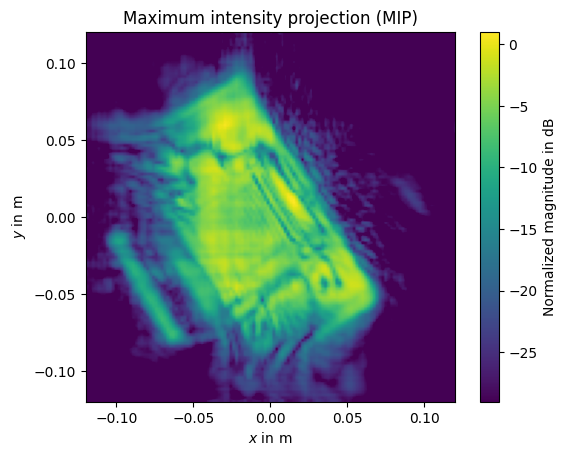

In [318]:
image = 20 * np.log10(np.abs(volume_max / np.max(volume_max)))
display(
    image,
    img_title="Maximum intensity projection (MIP)",
    cmap_label="Normalized magnitude in dB",
    xvec=x_vec,
    yvec=y_vec,
    dynamic_range=30,
    xlabel="$x$ in m",
    ylabel="$y$ in m",
)

In [329]:
image.astype(np.dtype("|U4"))

array([['-41.', '-45.', '-44.', ..., '-47.', '-48.', '-42.'],
       ['-44.', '-46.', '-46.', ..., '-47.', '-48.', '-45.'],
       ['-42.', '-45.', '-44.', ..., '-47.', '-51.', '-44.'],
       ...,
       ['-42.', '-44.', '-45.', ..., '-44.', '-44.', '-42.'],
       ['-42.', '-44.', '-45.', ..., '-44.', '-45.', '-44.'],
       ['-42.', '-45.', '-44.', ..., '-44.', '-44.', '-42.']], dtype='<U4')

In [333]:
plt.imsave("x.jpg", image.astype(np.dtype(int)))

In [334]:
from PIL import Image
  
# open method used to open different extension image file
im = Image.open(r"x.jpg") 

In [ ]:
triplet loss

Final

In [7]:
import json

with open(r"radar-task/dummy_measurements/labels_transformed.json") as f:
    d = json.load(f)

value_indexes = ["p_pivot_x", "p_pivot_y", "p_pivot_z", "alpha", "beta", "gamma"]
dummy_data = []
dummy_files = []
file_to_targets_dict = {}
for each in d:
    temp_arr = []
    dummy_files.append(each["file"])
    temp_arr.append(each["p_pivot"][0])
    temp_arr.append(each["p_pivot"][1])
    temp_arr.append(each["p_pivot"][2])
    temp_arr.append(each["alpha"])
    temp_arr.append(each["beta"])
    temp_arr.append(each["gamma"])
    dummy_data.append(temp_arr)
    file_to_targets_dict[each["file"]] = temp_arr
dummy_data = np.array(dummy_data)
dummy_files = np.array(dummy_files)

In [8]:
import random

dummy_files_shuffled = dummy_files.copy()
random.shuffle(dummy_files_shuffled)

Train data creation

In [361]:
import os


C0 = 299792458
FC = 77e9
LAMBDA = C0 / FC

Z_IDX = 13

train_test_split = 0.8

for i, each in enumerate(dummy_files_shuffled):

    volume, x_vec, y_vec, z_vec = import_volume(
        f"radar-task/dummy_measurements/volumes/{each}.img"
    )

    Nx = x_vec.size
    Ny = y_vec.size

    kx = (np.arange(-Nx / 2, Nx / 2 - 1)) / ((Nx - 1) * np.diff(x_vec[:2]))
    ky = (np.arange(-Ny / 2, Ny / 2 - 1)) / ((Ny - 1) * np.diff(y_vec[:2]))

    kx_n = kx * LAMBDA
    ky_n = ky * LAMBDA

    volume_max, kmax = compute_mip(volume)
    volume_max_range = (np.min(np.abs(volume_max)), np.max(np.abs(volume_max)))
    alpha_data = np.clip(
        1.8 * ((np.abs(volume_max) - volume_max_range[0]) / (volume_max_range[1] - volume_max_range[0])) - 0.25, 0, 1,
    )

    # 1 --> visualize magnitude of the MIP
    image = 20 * np.log10(np.abs(volume_max / np.max(volume_max)))

    if not os.path.exists(os.path.join(".", "input_data")):
        os.makedirs(os.path.join(".", "input_data"))
    
    if not os.path.exists(os.path.join(".", "input_data", "train")):
        os.makedirs(os.path.join(".", "input_data", "train"))
        
    if not os.path.exists(os.path.join(".", "input_data", "test")):
        os.makedirs(os.path.join(".", "input_data", "test"))
        
        
    
    if i<len(dummy_files_shuffled)*train_test_split:
        plt.imsave(os.path.join(".", "input_data", "train", f"{each}.jpg"), image.astype(np.dtype(int)))
    else:
        plt.imsave(os.path.join(".", "input_data", "test", f"{each}.jpg"), image.astype(np.dtype(int)))

In [55]:
import torch
from torch import nn
from torch import optim
import torch.nn.functional as F
from torchvision import datasets, transforms, models
from torch.utils.data import Dataset, DataLoader

import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2

import glob
from tqdm import tqdm

train_data_path = os.path.join('input_data', 'train') 
test_data_path = os.path.join('input_data', 'test') 

train_image_paths = [] #to store image paths in list
train_targets = [] #to store class values

for data_path in glob.glob(train_data_path + '/*'):
    train_targets.append(file_to_targets_dict[os.path.split(data_path)[-1].split(".")[0]]) 
    train_image_paths.append(data_path)
    
train_targets = np.array(train_targets, dtype=np.float32)

test_image_paths = []
test_targets = []

for data_path in glob.glob(test_data_path + '/*'):
    test_targets.append(file_to_targets_dict[os.path.split(data_path)[-1].split(".")[0]]) 
    test_image_paths.append(data_path)
    
test_targets = np.array(test_targets, dtype=np.float32)

In [56]:
train_transforms = A.Compose(
    [
        A.Resize(224, 224),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ]
)

test_transforms = A.Compose(
    [
        A.Resize(224, 224),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ]
)

In [57]:
from torch.utils.data import Dataset

class MicroWaveDataset(Dataset):
    def __init__(self, image_paths, transform=False):
        self.image_paths = image_paths
        self.transform = transform
        
    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_filepath = self.image_paths[idx]
        image = cv2.imread(image_filepath)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        label = train_targets[idx]
        if self.transform is not None:
            image = self.transform(image=image)["image"]
        
        return image, label
    
    
train_dataset = MicroWaveDataset(train_image_paths, train_transforms)
test_dataset = MicroWaveDataset(test_image_paths, test_transforms)

In [58]:
from torch.utils.data import DataLoader

batch_size = 4

train_loader = DataLoader(
    train_dataset, batch_size=batch_size, shuffle=False
)


test_loader = DataLoader(
    test_dataset, batch_size=batch_size, shuffle=False
)

In [59]:
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim


net = models.resnet18(pretrained=True)
num_ftrs  = net.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
net.fc = nn.Linear(num_ftrs, 6)

net = net.to(device)

criterion = nn.MSELoss()
optimizer = optim.Adam(net.parameters(), lr=0.001)

In [60]:
nof_epochs = 10
epoch = 0

print_per_iteration = 50

net.eval()
running_loss = 0.0
val_avg_loss = []
with torch.no_grad():
    for i, data in enumerate(test_loader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data

        inputs = inputs.to(device)

        labels = labels.to(device)


        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)

        # print statistics
        running_loss += loss.item()
        if i % print_per_iteration == (print_per_iteration-1):    # print every 2000 mini-batches
            print(f'validation: [{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_per_iteration:.6f}')
            val_avg_loss.append(running_loss / print_per_iteration)
            running_loss = 0.0
            
print("\navg val loss:", np.mean(val_avg_loss), "\n")
net.train()

for epoch in range(nof_epochs):  # loop over the dataset multiple times
    print("epoch:", epoch)
    running_loss = 0.0
    train_avg_loss = []
    for i, data in enumerate(train_loader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        
        inputs = inputs.to(device)
        
        labels = labels.to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        if i % print_per_iteration == (print_per_iteration-1):    # print every 2000 mini-batches
            print(f'train: [{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_per_iteration:.6f}')
            train_avg_loss.append(running_loss / print_per_iteration)
            running_loss = 0.0
    print("\navg train loss:", np.mean(train_avg_loss), "\n")
    
    net.eval()
    running_loss = 0.0
    val_avg_loss = []
    with torch.no_grad():
        for i, data in enumerate(test_loader, 0):
            # get the inputs; data is a list of [inputs, labels]
            inputs, labels = data

            inputs = inputs.to(device)

            labels = labels.to(device)


            # forward + backward + optimize
            outputs = net(inputs)
            loss = criterion(outputs, labels)

            # print statistics
            running_loss += loss.item()
            if i % print_per_iteration == (print_per_iteration-1):    # print every 2000 mini-batches
                print(f'validation: [{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_per_iteration:.6f}')
                val_avg_loss.append(running_loss / print_per_iteration)
                running_loss = 0.0
    print("\navg val loss:", np.mean(val_avg_loss), "\n")        
    net.train()

print('Finished Training')

validation: [1,    50] loss: 12.822996

avg val loss: 12.822995862960816 

epoch: 0
train: [1,    50] loss: 5.041010
train: [1,   100] loss: 3.853787
train: [1,   150] loss: 3.159753
train: [1,   200] loss: 3.002825

avg train loss: 3.764343686401844 

validation: [1,    50] loss: 27.724506

avg val loss: 27.724505558013917 

epoch: 1
train: [2,    50] loss: 3.330741
train: [2,   100] loss: 3.164789
train: [2,   150] loss: 2.566677
train: [2,   200] loss: 2.276977

avg train loss: 2.8347959233820434 

validation: [2,    50] loss: 30.166254

avg val loss: 30.16625352859497 

epoch: 2
train: [3,    50] loss: 2.647369
train: [3,   100] loss: 2.516116
train: [3,   150] loss: 2.073354
train: [3,   200] loss: 1.780097

avg train loss: 2.2542340759932995 

validation: [3,    50] loss: 35.833081

avg val loss: 35.83308097839355 

epoch: 3
train: [4,    50] loss: 2.018309
train: [4,   100] loss: 1.590336
train: [4,   150] loss: 1.471453
train: [4,   200] loss: 1.406773

avg train loss: 1.621717

In [61]:
torch.save(net, "model.pt")

In [489]:
from torch.utils.data import Dataset

class MicroWaveDataset(Dataset):
    def __init__(self, image_paths, transform=False):
        self.image_paths = image_paths
        self.transform = transform
        
    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_filepath = self.image_paths[idx]
        image = cv2.imread(image_filepath)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        label = train_targets[idx]
        if self.transform is not None:
            image = self.transform(image=image)["image"]
        
        return image, label[3:]
    
    
train_dataset = MicroWaveDataset(train_image_paths, train_transforms)
test_dataset = MicroWaveDataset(test_image_paths, test_transforms)

from torch.utils.data import DataLoader

batch_size = 4

train_loader = DataLoader(
    train_dataset, batch_size=batch_size, shuffle=False
)


test_loader = DataLoader(
    test_dataset, batch_size=batch_size, shuffle=False
)



import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim


net = models.resnet18(pretrained=True)
num_ftrs  = net.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
net.fc = nn.Linear(num_ftrs, 3)

net = net.to(device)

criterion = nn.MSELoss()
optimizer = optim.Adam(net.parameters(), lr=0.001)





nof_epochs = 10
epoch = 0

print_per_iteration = 50

net.eval()
running_loss = 0.0
val_avg_loss = []
with torch.no_grad():
    for i, data in enumerate(test_loader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data

        inputs = inputs.to(device)

        labels = labels.to(device)


        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)

        # print statistics
        running_loss += loss.item()
        if i % print_per_iteration == (print_per_iteration-1):    # print every 2000 mini-batches
            print(f'validation: [{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_per_iteration:.6f}')
            val_avg_loss.append(running_loss / print_per_iteration)
            running_loss = 0.0
            
print("\navg val loss:", np.mean(val_avg_loss), "\n")
net.train()

for epoch in range(nof_epochs):  # loop over the dataset multiple times
    print("epoch:", epoch)
    running_loss = 0.0
    train_avg_loss = []
    for i, data in enumerate(train_loader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        
        inputs = inputs.to(device)
        
        labels = labels.to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        if i % print_per_iteration == (print_per_iteration-1):    # print every 2000 mini-batches
            print(f'train: [{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_per_iteration:.6f}')
            train_avg_loss.append(running_loss / print_per_iteration)
            running_loss = 0.0
    print("\navg train loss:", np.mean(train_avg_loss), "\n")
    
    net.eval()
    running_loss = 0.0
    val_avg_loss = []
    with torch.no_grad():
        for i, data in enumerate(test_loader, 0):
            # get the inputs; data is a list of [inputs, labels]
            inputs, labels = data

            inputs = inputs.to(device)

            labels = labels.to(device)


            # forward + backward + optimize
            outputs = net(inputs)
            loss = criterion(outputs, labels)

            # print statistics
            running_loss += loss.item()
            if i % print_per_iteration == (print_per_iteration-1):    # print every 2000 mini-batches
                print(f'validation: [{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_per_iteration:.6f}')
                val_avg_loss.append(running_loss / print_per_iteration)
                running_loss = 0.0
    print("\navg val loss:", np.mean(val_avg_loss), "\n")        
    net.train()

print('Finished Training')

validation: [1,    50] loss: 26.467016

avg val loss: 26.467016048431397 

epoch: 0
train: [1,    50] loss: 10.488278
train: [1,   100] loss: 9.247732
train: [1,   150] loss: 7.663381
train: [1,   200] loss: 6.304088

avg train loss: 8.425869755744934 

validation: [1,    50] loss: 58.412510

avg val loss: 58.41250991821289 

epoch: 1
train: [2,    50] loss: 5.742319
train: [2,   100] loss: 5.857427
train: [2,   150] loss: 5.753558
train: [2,   200] loss: 5.314008

avg train loss: 5.666827935576439 

validation: [2,    50] loss: 84.401861

avg val loss: 84.40186130523682 

epoch: 2
train: [3,    50] loss: 6.400538
train: [3,   100] loss: 4.947844
train: [3,   150] loss: 3.699778
train: [3,   200] loss: 4.366850

avg train loss: 4.853752445280552 

validation: [3,    50] loss: 59.543669

avg val loss: 59.54366916656494 

epoch: 3
train: [4,    50] loss: 3.971292
train: [4,   100] loss: 4.111063
train: [4,   150] loss: 2.504218
train: [4,   200] loss: 2.358354

avg train loss: 3.23623194

In [5]:
import json

with open(r"radar-task/radar_measurements/labels_transformed.json") as f:
    d = json.load(f)

value_indexes = ["p_pivot_x", "p_pivot_y", "p_pivot_z", "alpha", "beta", "gamma"]
radar_data = []
radar_files = []
radar_file_to_targets_dict = {}
for each in d:
    temp_arr = []
    radar_files.append(each["file"])
    temp_arr.append(each["p_pivot"][0])
    temp_arr.append(each["p_pivot"][1])
    temp_arr.append(each["p_pivot"][2])
    temp_arr.append(each["alpha"])
    temp_arr.append(each["beta"])
    temp_arr.append(each["gamma"])
    radar_data.append(temp_arr)
    radar_file_to_targets_dict[each["file"]] = temp_arr
radar_data = np.array(radar_data)
radar_files = np.array(radar_files)

In [6]:
import random

radar_files_shuffled = radar_files.copy()
random.shuffle(radar_files_shuffled)

In [492]:
import os


C0 = 299792458
FC = 77e9
LAMBDA = C0 / FC

Z_IDX = 13

train_test_split = 0.8



for i, each in enumerate(radar_files_shuffled):

    volume, x_vec, y_vec, z_vec = import_volume(
        f"radar-task/radar_measurements/volumes/{each}.img"
    )

    Nx = x_vec.size
    Ny = y_vec.size

    kx = (np.arange(-Nx / 2, Nx / 2 - 1)) / ((Nx - 1) * np.diff(x_vec[:2]))
    ky = (np.arange(-Ny / 2, Ny / 2 - 1)) / ((Ny - 1) * np.diff(y_vec[:2]))

    kx_n = kx * LAMBDA
    ky_n = ky * LAMBDA

    volume_max, kmax = compute_mip(volume)
    volume_max_range = (np.min(np.abs(volume_max)), np.max(np.abs(volume_max)))
    alpha_data = np.clip(
        1.8 * ((np.abs(volume_max) - volume_max_range[0]) / (volume_max_range[1] - volume_max_range[0])) - 0.25, 0, 1,
    )

    # 1 --> visualize magnitude of the MIP
    image = 20 * np.log10(np.abs(volume_max / np.max(volume_max)))

    if not os.path.exists(os.path.join(".", "input_data")):
        os.makedirs(os.path.join(".", "input_data"))
    
    if not os.path.exists(os.path.join(".", "input_data", "train")):
        os.makedirs(os.path.join(".", "input_data", "train"))
        
    if not os.path.exists(os.path.join(".", "input_data", "test")):
        os.makedirs(os.path.join(".", "input_data", "test"))
        
    if not os.path.exists(os.path.join(".", "input_data", "radar")):
        os.makedirs(os.path.join(".", "input_data", "radar"))
        
        
    
    if i<len(dummy_files_shuffled)*train_test_split:
        plt.imsave(os.path.join(".", "input_data", "radar", f"{each}.jpg"), image.astype(np.dtype(int)))
    else:
        plt.imsave(os.path.join(".", "input_data", "radar", f"{each}.jpg"), image.astype(np.dtype(int)))

In [493]:
train_data_path = os.path.join('input_data', 'train') 
test_data_path = os.path.join('input_data', 'test') 
radar_data_path = os.path.join('input_data', 'radar') 

train_image_paths = [] #to store image paths in list
train_targets = [] #to store class values

for data_path in glob.glob(train_data_path + '/*'):
    train_targets.append(file_to_targets_dict[os.path.split(data_path)[-1].split(".")[0]]) 
    train_image_paths.append(data_path)
    


for data_path in glob.glob(test_data_path + '/*'):
    train_targets.append(file_to_targets_dict[os.path.split(data_path)[-1].split(".")[0]]) 
    train_image_paths.append(data_path)
    
train_targets = np.array(train_targets, dtype=np.float32)



radar_image_paths = []
radar_targets = []

for data_path in glob.glob(radar_data_path + '/*'):
    radar_targets.append(radar_file_to_targets_dict[os.path.split(data_path)[-1].split(".")[0]]) 
    radar_image_paths.append(data_path)
    
radar_targets = np.array(radar_targets, dtype=np.float32)

In [494]:
class MicroWaveDataset(Dataset):
    def __init__(self, image_paths, transform=False):
        self.image_paths = image_paths
        self.transform = transform
        
    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_filepath = self.image_paths[idx]
        image = cv2.imread(image_filepath)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        label = train_targets[idx]
        if self.transform is not None:
            image = self.transform(image=image)["image"]
        
        return image, label[:3]

train_dataset = MicroWaveDataset(train_image_paths, train_transforms)
radar_dataset = MicroWaveDataset(radar_image_paths, test_transforms)

batch_size = 4

train_loader = DataLoader(
    train_dataset, batch_size=batch_size, shuffle=False
)


radar_loader = DataLoader(
    radar_dataset, batch_size=batch_size, shuffle=False
)

In [495]:
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim


net = models.resnet18(pretrained=True)
num_ftrs  = net.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
net.fc = nn.Linear(num_ftrs, 3)

net = net.to(device)

criterion = nn.MSELoss()
optimizer = optim.Adam(net.parameters(), lr=0.001)

In [496]:
nof_epochs = 10
epoch = 0

print_per_iteration = 50

net.eval()
running_loss = 0.0
val_avg_loss = []
with torch.no_grad():
    for i, data in enumerate(radar_loader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data

        inputs = inputs.to(device)

        labels = labels.to(device)


        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)

        # print statistics
        running_loss += loss.item()
        if i % print_per_iteration == (print_per_iteration-1):    # print every 2000 mini-batches
            print(f'validation: [{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_per_iteration:.6f}')
            val_avg_loss.append(running_loss / print_per_iteration)
            running_loss = 0.0
            
print("\navg val loss:", np.mean(val_avg_loss), "\n")
net.train()

for epoch in range(nof_epochs):  # loop over the dataset multiple times
    print("epoch:", epoch)
    running_loss = 0.0
    train_avg_loss = []
    for i, data in enumerate(train_loader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        
        inputs = inputs.to(device)
        
        labels = labels.to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        if i % print_per_iteration == (print_per_iteration-1):    # print every 2000 mini-batches
            print(f'train: [{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_per_iteration:.6f}')
            train_avg_loss.append(running_loss / print_per_iteration)
            running_loss = 0.0
    print("\navg train loss:", np.mean(train_avg_loss), "\n")
    
    net.eval()
    running_loss = 0.0
    val_avg_loss = []
    with torch.no_grad():
        for i, data in enumerate(radar_loader, 0):
            # get the inputs; data is a list of [inputs, labels]
            inputs, labels = data

            inputs = inputs.to(device)

            labels = labels.to(device)


            # forward + backward + optimize
            outputs = net(inputs)
            loss = criterion(outputs, labels)

            # print statistics
            running_loss += loss.item()
            if i % print_per_iteration == (print_per_iteration-1):    # print every 2000 mini-batches
                print(f'validation: [{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_per_iteration:.6f}')
                val_avg_loss.append(running_loss / print_per_iteration)
                running_loss = 0.0
    print("\navg val loss:", np.mean(val_avg_loss), "\n")        
    net.train()

print('Finished Training')

validation: [1,    50] loss: 0.299117
validation: [1,   100] loss: 0.299682
validation: [1,   150] loss: 0.304931
validation: [1,   200] loss: 0.300843
validation: [1,   250] loss: 0.291406

avg val loss: 0.29919601994752887 

epoch: 0
train: [1,    50] loss: 0.061988
train: [1,   100] loss: 0.000340
train: [1,   150] loss: 0.000229
train: [1,   200] loss: 0.000254
train: [1,   250] loss: 0.000180

avg train loss: 0.012598125693417386 

validation: [1,    50] loss: 0.000308
validation: [1,   100] loss: 0.000341
validation: [1,   150] loss: 0.000330
validation: [1,   200] loss: 0.000312
validation: [1,   250] loss: 0.000325

avg val loss: 0.0003230116233462468 

epoch: 1
train: [2,    50] loss: 0.000141
train: [2,   100] loss: 0.000129
train: [2,   150] loss: 0.000127
train: [2,   200] loss: 0.000132
train: [2,   250] loss: 0.000118

avg train loss: 0.00012940670663374478 

validation: [2,    50] loss: 0.000260
validation: [2,   100] loss: 0.000273
validation: [2,   150] loss: 0.000291


In [497]:
from torch.utils.data import Dataset

class MicroWaveDataset(Dataset):
    def __init__(self, image_paths, transform=False):
        self.image_paths = image_paths
        self.transform = transform
        
    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_filepath = self.image_paths[idx]
        image = cv2.imread(image_filepath)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        label = train_targets[idx]
        if self.transform is not None:
            image = self.transform(image=image)["image"]
        
        return image, label[3:]
    
    
train_dataset = MicroWaveDataset(train_image_paths, train_transforms)
radar_dataset = MicroWaveDataset(radar_image_paths, test_transforms)

from torch.utils.data import DataLoader

batch_size = 4

train_loader = DataLoader(
    train_dataset, batch_size=batch_size, shuffle=False
)


radar_loader = DataLoader(
    radar_dataset, batch_size=batch_size, shuffle=False
)



import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim


net = models.resnet18(pretrained=True)
num_ftrs  = net.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
net.fc = nn.Linear(num_ftrs, 3)

net = net.to(device)

criterion = nn.MSELoss()
optimizer = optim.Adam(net.parameters(), lr=0.001)





nof_epochs = 10
epoch = 0

print_per_iteration = 50

net.eval()
running_loss = 0.0
val_avg_loss = []
with torch.no_grad():
    for i, data in enumerate(radar_loader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data

        inputs = inputs.to(device)

        labels = labels.to(device)


        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)

        # print statistics
        running_loss += loss.item()
        if i % print_per_iteration == (print_per_iteration-1):    # print every 2000 mini-batches
            print(f'validation: [{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_per_iteration:.6f}')
            val_avg_loss.append(running_loss / print_per_iteration)
            running_loss = 0.0
            
print("\navg val loss:", np.mean(val_avg_loss), "\n")
net.train()

for epoch in range(nof_epochs):  # loop over the dataset multiple times
    print("epoch:", epoch)
    running_loss = 0.0
    train_avg_loss = []
    for i, data in enumerate(train_loader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        
        inputs = inputs.to(device)
        
        labels = labels.to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        if i % print_per_iteration == (print_per_iteration-1):    # print every 2000 mini-batches
            print(f'train: [{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_per_iteration:.6f}')
            train_avg_loss.append(running_loss / print_per_iteration)
            running_loss = 0.0
    print("\navg train loss:", np.mean(train_avg_loss), "\n")
    
    net.eval()
    running_loss = 0.0
    val_avg_loss = []
    with torch.no_grad():
        for i, data in enumerate(radar_loader, 0):
            # get the inputs; data is a list of [inputs, labels]
            inputs, labels = data

            inputs = inputs.to(device)

            labels = labels.to(device)


            # forward + backward + optimize
            outputs = net(inputs)
            loss = criterion(outputs, labels)

            # print statistics
            running_loss += loss.item()
            if i % print_per_iteration == (print_per_iteration-1):    # print every 2000 mini-batches
                print(f'validation: [{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_per_iteration:.6f}')
                val_avg_loss.append(running_loss / print_per_iteration)
                running_loss = 0.0
    print("\navg val loss:", np.mean(val_avg_loss), "\n")        
    net.train()

print('Finished Training')

validation: [1,    50] loss: 25.396668
validation: [1,   100] loss: 24.393418
validation: [1,   150] loss: 24.206689
validation: [1,   200] loss: 22.866505
validation: [1,   250] loss: 24.844230

avg val loss: 24.341501827239988 

epoch: 0
train: [1,    50] loss: 12.110520
train: [1,   100] loss: 8.122262
train: [1,   150] loss: 7.397854
train: [1,   200] loss: 7.075596
train: [1,   250] loss: 6.802580

avg train loss: 8.301762369155885 

validation: [1,    50] loss: 56.833103
validation: [1,   100] loss: 57.729185
validation: [1,   150] loss: 55.271286
validation: [1,   200] loss: 48.772592
validation: [1,   250] loss: 55.871928

avg val loss: 54.895618997573855 

epoch: 1
train: [2,    50] loss: 6.521918
train: [2,   100] loss: 5.739310
train: [2,   150] loss: 7.372676
train: [2,   200] loss: 4.879441
train: [2,   250] loss: 4.514649

avg train loss: 5.805598661661148 

validation: [2,    50] loss: 62.121201
validation: [2,   100] loss: 66.402574
validation: [2,   150] loss: 59.05844

triplet loss

In [498]:
train_data_path = os.path.join('input_data', 'train') 
test_data_path = os.path.join('input_data', 'test') 
radar_data_path = os.path.join('input_data', 'radar') 

train_image_paths = [] #to store image paths in list
train_targets = [] #to store class values

for data_path in glob.glob(train_data_path + '/*'):
    train_targets.append(file_to_targets_dict[os.path.split(data_path)[-1].split(".")[0]]) 
    train_image_paths.append(data_path)
    


for data_path in glob.glob(test_data_path + '/*'):
    train_targets.append(file_to_targets_dict[os.path.split(data_path)[-1].split(".")[0]]) 
    train_image_paths.append(data_path)
    
train_targets = np.array(train_targets, dtype=np.float32)



radar_image_paths = []
radar_targets = []

for data_path in glob.glob(radar_data_path + '/*'):
    radar_targets.append(radar_file_to_targets_dict[os.path.split(data_path)[-1].split(".")[0]]) 
    radar_image_paths.append(data_path)
    
radar_targets = np.array(radar_targets, dtype=np.float32)

class MicroWaveDataset(Dataset):
    def __init__(self, image_paths, transform=False):
        self.image_paths = image_paths
        self.transform = transform
        
    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_filepath = self.image_paths[idx]
        image = cv2.imread(image_filepath)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        label = train_targets[idx]
        if self.transform is not None:
            image = self.transform(image=image)["image"]
        
        return image, label[:1]

train_dataset = MicroWaveDataset(train_image_paths, train_transforms)
radar_dataset = MicroWaveDataset(radar_image_paths, test_transforms)

batch_size = 4

train_loader = DataLoader(
    train_dataset, batch_size=batch_size, shuffle=False
)


radar_loader = DataLoader(
    radar_dataset, batch_size=batch_size, shuffle=False
)

import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim


net = models.resnet18(pretrained=True)
num_ftrs  = net.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
net.fc = nn.Linear(num_ftrs, 1)

net = net.to(device)

criterion = nn.MSELoss()
optimizer = optim.Adam(net.parameters(), lr=0.001)

nof_epochs = 10
epoch = 0

print_per_iteration = 50

net.eval()
running_loss = 0.0
val_avg_loss = []
current_train_embeddings = []
with torch.no_grad():
    
    for i, data in enumerate(train_loader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        
        inputs = inputs.to(device)
        
        labels = labels.to(device)

        outputs = net(inputs)
        
        current_train_embeddings.append(outputs)
    
    for i, data in enumerate(radar_loader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data

        inputs = inputs.to(device)

        labels = labels.to(device)


        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)

        # print statistics
        running_loss += loss.item()
        if i % print_per_iteration == (print_per_iteration-1):    # print every 2000 mini-batches
            print(f'validation: [{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_per_iteration:.6f}')
            val_avg_loss.append(running_loss / print_per_iteration)
            running_loss = 0.0
            
print("\navg val loss:", np.mean(val_avg_loss), "\n")
net.train()

for epoch in range(nof_epochs):  # loop over the dataset multiple times
    print("epoch:", epoch)
    running_loss = 0.0
    train_avg_loss = []
    for i, data in enumerate(train_loader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        
        inputs = inputs.to(device)
        
        labels = labels.to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        
        
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        if i % print_per_iteration == (print_per_iteration-1):    # print every 2000 mini-batches
            print(f'train: [{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_per_iteration:.6f}')
            train_avg_loss.append(running_loss / print_per_iteration)
            running_loss = 0.0
    print("\navg train loss:", np.mean(train_avg_loss), "\n")
    
    net.eval()
    running_loss = 0.0
    val_avg_loss = []
    with torch.no_grad():
        for i, data in enumerate(radar_loader, 0):
            # get the inputs; data is a list of [inputs, labels]
            inputs, labels = data

            inputs = inputs.to(device)

            labels = labels.to(device)


            # forward + backward + optimize
            outputs = net(inputs)
            loss = criterion(outputs, labels)

            # print statistics
            running_loss += loss.item()
            if i % print_per_iteration == (print_per_iteration-1):    # print every 2000 mini-batches
                print(f'validation: [{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_per_iteration:.6f}')
                val_avg_loss.append(running_loss / print_per_iteration)
                running_loss = 0.0
    print("\navg val loss:", np.mean(val_avg_loss), "\n")        
    net.train()

print('Finished Training')

validation: [1,    50] loss: 0.421458
validation: [1,   100] loss: 0.442373
validation: [1,   150] loss: 0.421868
validation: [1,   200] loss: 0.433885
validation: [1,   250] loss: 0.429501

avg val loss: 0.4298169320821762 

epoch: 0
train: [1,    50] loss: 0.086695
train: [1,   100] loss: 0.000544
train: [1,   150] loss: 0.000229
train: [1,   200] loss: 0.000217
train: [1,   250] loss: 0.000173

avg train loss: 0.017571689507196425 

validation: [1,    50] loss: 0.000241
validation: [1,   100] loss: 0.000273
validation: [1,   150] loss: 0.000264
validation: [1,   200] loss: 0.000246
validation: [1,   250] loss: 0.000259

avg val loss: 0.0002564686827827245 

epoch: 1
train: [2,    50] loss: 0.000144
train: [2,   100] loss: 0.000118
train: [2,   150] loss: 0.000198
train: [2,   200] loss: 0.000134
train: [2,   250] loss: 0.000096

avg train loss: 0.00013800208427710458 

validation: [2,    50] loss: 0.000316
validation: [2,   100] loss: 0.000327
validation: [2,   150] loss: 0.000342
v

In [560]:
train_data_path = os.path.join('input_data', 'train') 
test_data_path = os.path.join('input_data', 'test') 
radar_data_path = os.path.join('input_data', 'radar') 

train_image_paths = [] #to store image paths in list
train_targets = [] #to store class values

for data_path in glob.glob(train_data_path + '/*'):
    train_targets.append(file_to_targets_dict[os.path.split(data_path)[-1].split(".")[0]]) 
    train_image_paths.append(data_path)
    


for data_path in glob.glob(test_data_path + '/*'):
    train_targets.append(file_to_targets_dict[os.path.split(data_path)[-1].split(".")[0]]) 
    train_image_paths.append(data_path)
    
train_targets = np.array(train_targets, dtype=np.float32)



radar_image_paths = []
radar_targets = []

for data_path in glob.glob(radar_data_path + '/*'):
    radar_targets.append(radar_file_to_targets_dict[os.path.split(data_path)[-1].split(".")[0]]) 
    radar_image_paths.append(data_path)
    
radar_targets = np.array(radar_targets, dtype=np.float32)

class MicroWaveDataset(Dataset):
    def __init__(self, image_paths, transform=False):
        self.image_paths = image_paths
        self.transform = transform
        
    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_filepath = self.image_paths[idx]
        image = cv2.imread(image_filepath)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        label = train_targets[idx]
        if self.transform is not None:
            image = self.transform(image=image)["image"]
        
        return image, label[:1]
    
class MicroWaveTripletDataset(Dataset):
    def __init__(self, image_paths, transform=False):
        self.image_paths = image_paths
        self.transform = transform
        self.range_list = list(range(len(self.image_paths)))
        
    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        
        temp_range_list = self.range_list.copy()
        
        temp_range_list.remove(idx)
        
        other_idxs = np.random.choice(temp_range_list, 2)
        
        image_filepath = self.image_paths[idx]
        image = cv2.imread(image_filepath)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        label = train_targets[idx]
        if self.transform is not None:
            image = self.transform(image=image)["image"]
            
        image_filepath1 = self.image_paths[other_idxs[0]]
        image1 = cv2.imread(image_filepath1)
        image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
        label1 = train_targets[other_idxs[0]]
        if self.transform is not None:
            image1 = self.transform(image=image1)["image"]
            
        image_filepath2 = self.image_paths[other_idxs[1]]
        image2 = cv2.imread(image_filepath2)
        image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
        label2 = train_targets[other_idxs[1]]
        if self.transform is not None:
            image2 = self.transform(image=image2)["image"]
            
        if abs(label1[0]-label[0])>abs(label2[0]-label[0]):
            return image, label[:1], image2, label2[:1], image1, label1[:1]
        else:
            return image, label[:1], image1, label1[:1], image2, label2[:1]
        

train_dataset = MicroWaveDataset(train_image_paths, train_transforms)
radar_dataset = MicroWaveDataset(radar_image_paths, test_transforms)

train_triplet_dataset = MicroWaveTripletDataset(train_image_paths, train_transforms)

batch_size = 4

train_loader = DataLoader(
    train_dataset, batch_size=batch_size, shuffle=False
)


radar_loader = DataLoader(
    radar_dataset, batch_size=batch_size, shuffle=False
)

train_triplet_loader = DataLoader(
    train_triplet_dataset, batch_size=batch_size, shuffle=False
)

import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim


net = models.resnet18(pretrained=True)
num_ftrs  = net.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
net.fc = nn.Linear(num_ftrs, 8)

net = net.to(device)

criterion = nn.MSELoss()
optimizer = optim.Adam(net.parameters(), lr=0.001)

cos = nn.CosineSimilarity(dim=1, eps=1e-6)

nof_epochs = 10
epoch = 0

print_per_iteration = 50

net.eval()
running_loss = 0.0
val_avg_loss = []

with torch.no_grad():
    current_train_embeddings = []
    for i, data in enumerate(train_loader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        
        inputs = inputs.to(device)
        
        labels = labels.to(device)

        outputs = net(inputs)
        
        current_train_embeddings.append(outputs)
        
    current_train_embeddings = torch.concat(current_train_embeddings, axis=0)
    
    current_train_embeddings = current_train_embeddings.to(device)
    
    for i, data in enumerate(radar_loader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data

        inputs = inputs.to(device)

        labels = labels.to(device)


        # forward + backward + optimize
        outputs = net(inputs)
        
        
        predictions = torch.tensor(train_targets[torch.argmax(outputs@current_train_embeddings.T, axis=1).detach().cpu().numpy()][:, :1]).to(device)
        loss = criterion(predictions, labels)

        # print statistics
        running_loss += loss.item()
        if i % print_per_iteration == (print_per_iteration-1):    # print every 2000 mini-batches
            print(f'validation: [{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_per_iteration:.6f}')
            val_avg_loss.append(running_loss / print_per_iteration)
            running_loss = 0.0
            
print("\navg val loss:", np.mean(val_avg_loss), "\n")
net.train()

for epoch in range(nof_epochs):  # loop over the dataset multiple times
    print("epoch:", epoch)
    running_loss = 0.0
    train_avg_loss = []
    for i, data in enumerate(train_triplet_loader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels, inputs1, labels1, inputs2, labels2 = data
        
        inputs = inputs.to(device)
        labels = labels.to(device)
        
        inputs1 = inputs1.to(device)
        labels1 = labels1.to(device)
        
        inputs2 = inputs2.to(device)
        labels2 = labels2.to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        outputs1 = net(inputs1)
        outputs2 = net(inputs2)
        
        
        loss = -(cos(outputs, outputs1)-cos(outputs, outputs2)).sum()
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        if i % print_per_iteration == (print_per_iteration-1):    # print every 2000 mini-batches
            print(f'train: [{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_per_iteration:.6f}')
            train_avg_loss.append(running_loss / print_per_iteration)
            running_loss = 0.0
    print("\navg train loss:", np.mean(train_avg_loss), "\n")
    
    net.eval()
    running_loss = 0.0
    val_avg_loss = []
    with torch.no_grad():
        current_train_embeddings = []
        for i, data in enumerate(train_loader, 0):
            # get the inputs; data is a list of [inputs, labels]
            inputs, labels = data

            inputs = inputs.to(device)

            labels = labels.to(device)

            outputs = net(inputs)

            current_train_embeddings.append(outputs)

        current_train_embeddings = torch.concat(current_train_embeddings, axis=0)

        current_train_embeddings = current_train_embeddings.to(device)
    
        for i, data in enumerate(radar_loader, 0):
            # get the inputs; data is a list of [inputs, labels]
            inputs, labels = data

            inputs = inputs.to(device)

            labels = labels.to(device)


            # forward + backward + optimize
            outputs = net(inputs)
            predictions = torch.tensor(train_targets[torch.argmax(outputs@current_train_embeddings.T, axis=1).detach().cpu().numpy()][:, :1]).to(device)
            loss = criterion(predictions, labels)

            # print statistics
            running_loss += loss.item()
            if i % print_per_iteration == (print_per_iteration-1):    # print every 2000 mini-batches
                print(f'validation: [{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_per_iteration:.6f}')
                val_avg_loss.append(running_loss / print_per_iteration)
                running_loss = 0.0
    print("\navg val loss:", np.mean(val_avg_loss), "\n")        
    net.train()

print('Finished Training')

validation: [1,    50] loss: 0.000305
validation: [1,   100] loss: 0.000297
validation: [1,   150] loss: 0.000276
validation: [1,   200] loss: 0.000302
validation: [1,   250] loss: 0.000268

avg val loss: 0.00028959744027088165 

epoch: 0
train: [1,    50] loss: 0.321101
train: [1,   100] loss: 0.005240
train: [1,   150] loss: -0.008236
train: [1,   200] loss: -0.173272
train: [1,   250] loss: -0.002895

avg train loss: 0.02838743409514427 

validation: [1,    50] loss: 0.000417
validation: [1,   100] loss: 0.000393
validation: [1,   150] loss: 0.000412
validation: [1,   200] loss: 0.000409
validation: [1,   250] loss: 0.000385

avg val loss: 0.00040307076100725683 

epoch: 1
train: [2,    50] loss: -0.006821
train: [2,   100] loss: -0.423525
train: [2,   150] loss: -0.798900
train: [2,   200] loss: -0.130201
train: [2,   250] loss: -0.914604

avg train loss: -0.45481025642156603 

validation: [2,    50] loss: 0.000093
validation: [2,   100] loss: 0.000088
validation: [2,   150] loss: 

rotation

In [563]:
import os


C0 = 299792458
FC = 77e9
LAMBDA = C0 / FC

Z_IDX = 13

train_test_split = 0.8



for i, each in enumerate(radar_files_shuffled):

    volume, x_vec, y_vec, z_vec = import_volume(
        f"radar-task/radar_measurements/volumes/{each}.img"
    )

    Nx = x_vec.size
    Ny = y_vec.size

    kx = (np.arange(-Nx / 2, Nx / 2 - 1)) / ((Nx - 1) * np.diff(x_vec[:2]))
    ky = (np.arange(-Ny / 2, Ny / 2 - 1)) / ((Ny - 1) * np.diff(y_vec[:2]))

    kx_n = kx * LAMBDA
    ky_n = ky * LAMBDA

    volume_max, kmax = compute_mip(volume)
    volume_max_range = (np.min(np.abs(volume_max)), np.max(np.abs(volume_max)))
    alpha_data = np.clip(
        1.8 * ((np.abs(volume_max) - volume_max_range[0]) / (volume_max_range[1] - volume_max_range[0])) - 0.25, 0, 1,
    )

    # 1 --> visualize magnitude of the MIP
    # image = 20 * np.log10(np.abs(volume_max / np.max(volume_max)))
    
        # 2 --> visualize phase of the MIP (opacity scaled by alpha_data)
    _, volume_max_phase = complex2magphase(
        np.multiply(volume_max, np.exp(((1j * 2 * math.pi) / LAMBDA) * 2 * z_vec[kmax]))
    )
    
    image = 180 / math.pi * volume_max_phase

    if not os.path.exists(os.path.join(".", "input_data1")):
        os.makedirs(os.path.join(".", "input_data1"))
    
    if not os.path.exists(os.path.join(".", "input_data1", "train")):
        os.makedirs(os.path.join(".", "input_data1", "train"))
        
    if not os.path.exists(os.path.join(".", "input_data1", "test")):
        os.makedirs(os.path.join(".", "input_data1", "test"))
        
    if not os.path.exists(os.path.join(".", "input_data1", "radar")):
        os.makedirs(os.path.join(".", "input_data1", "radar"))
        
        
    
    if i<len(dummy_files_shuffled)*train_test_split:
        plt.imsave(os.path.join(".", "input_data1", "radar", f"{each}.jpg"), image.astype(np.dtype(int)))
    else:
        plt.imsave(os.path.join(".", "input_data1", "radar", f"{each}.jpg"), image.astype(np.dtype(int)))
    

In [566]:
import os


C0 = 299792458
FC = 77e9
LAMBDA = C0 / FC

Z_IDX = 13

train_test_split = 0.8



for i, each in enumerate(dummy_files_shuffled):

    volume, x_vec, y_vec, z_vec = import_volume(
        f"radar-task/dummy_measurements/volumes/{each}.img"
    )

    Nx = x_vec.size
    Ny = y_vec.size

    kx = (np.arange(-Nx / 2, Nx / 2 - 1)) / ((Nx - 1) * np.diff(x_vec[:2]))
    ky = (np.arange(-Ny / 2, Ny / 2 - 1)) / ((Ny - 1) * np.diff(y_vec[:2]))

    kx_n = kx * LAMBDA
    ky_n = ky * LAMBDA

    volume_max, kmax = compute_mip(volume)
    volume_max_range = (np.min(np.abs(volume_max)), np.max(np.abs(volume_max)))
    alpha_data = np.clip(
        1.8 * ((np.abs(volume_max) - volume_max_range[0]) / (volume_max_range[1] - volume_max_range[0])) - 0.25, 0, 1,
    )

    # 1 --> visualize magnitude of the MIP
    # image = 20 * np.log10(np.abs(volume_max / np.max(volume_max)))
    
        # 2 --> visualize phase of the MIP (opacity scaled by alpha_data)
    _, volume_max_phase = complex2magphase(
        np.multiply(volume_max, np.exp(((1j * 2 * math.pi) / LAMBDA) * 2 * z_vec[kmax]))
    )
    
    image = 180 / math.pi * volume_max_phase

    if not os.path.exists(os.path.join(".", "input_data1")):
        os.makedirs(os.path.join(".", "input_data1"))
    
    if not os.path.exists(os.path.join(".", "input_data1", "train")):
        os.makedirs(os.path.join(".", "input_data1", "train"))
        
    if not os.path.exists(os.path.join(".", "input_data1", "test")):
        os.makedirs(os.path.join(".", "input_data1", "test"))
        
    if not os.path.exists(os.path.join(".", "input_data1", "radar")):
        os.makedirs(os.path.join(".", "input_data1", "radar"))
        
        
    
    if i<len(dummy_files_shuffled)*train_test_split:
        plt.imsave(os.path.join(".", "input_data1", "train", f"{each}.jpg"), image.astype(np.dtype(int)))
    else:
        plt.imsave(os.path.join(".", "input_data1", "test", f"{each}.jpg"), image.astype(np.dtype(int)))
    

In [32]:
train_data_path = os.path.join('input_data', 'train') 
test_data_path = os.path.join('input_data', 'test') 
radar_data_path = os.path.join('input_data', 'radar') 

train_image_paths = [] #to store image paths in list
train_targets = [] #to store class values

for data_path in glob.glob(train_data_path + '/*'):
    train_targets.append(file_to_targets_dict[os.path.split(data_path)[-1].split(".")[0]]) 
    train_image_paths.append(data_path)
    


for data_path in glob.glob(test_data_path + '/*'):
    train_targets.append(file_to_targets_dict[os.path.split(data_path)[-1].split(".")[0]]) 
    train_image_paths.append(data_path)
    
train_targets = np.array(train_targets, dtype=np.float32)



radar_image_paths = []
radar_targets = []

for data_path in glob.glob(radar_data_path + '/*'):
    radar_targets.append(radar_file_to_targets_dict[os.path.split(data_path)[-1].split(".")[0]]) 
    radar_image_paths.append(data_path)
    
radar_targets = np.array(radar_targets, dtype=np.float32)

class MicroWaveDataset(Dataset):
    def __init__(self, image_paths, transform=False):
        self.image_paths = image_paths
        self.transform = transform
        
    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_filepath = self.image_paths[idx]
        image = cv2.imread(image_filepath)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        label = train_targets[idx]
        if self.transform is not None:
            image = self.transform(image=image)["image"]
        
        return image, label[3:4]

train_dataset = MicroWaveDataset(train_image_paths, train_transforms)
radar_dataset = MicroWaveDataset(radar_image_paths, test_transforms)

batch_size = 4

train_loader = DataLoader(
    train_dataset, batch_size=batch_size, shuffle=False
)


radar_loader = DataLoader(
    radar_dataset, batch_size=batch_size, shuffle=False
)

import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim


net = models.resnet18(pretrained=True)
num_ftrs  = net.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
net.fc = nn.Linear(num_ftrs, 1)

net = net.to(device)

criterion = nn.MSELoss()
optimizer = optim.Adam(net.parameters(), lr=0.001)

nof_epochs = 10
epoch = 0

print_per_iteration = 50

net.eval()
running_loss = 0.0
val_avg_loss = []
current_train_embeddings = []
with torch.no_grad():
    
    for i, data in enumerate(train_loader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        
        inputs = inputs.to(device)
        
        labels = labels.to(device)

        outputs = net(inputs)
        
        current_train_embeddings.append(outputs)
    
    for i, data in enumerate(radar_loader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data

        inputs = inputs.to(device)

        labels = labels.to(device)


        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)

        # print statistics
        running_loss += loss.item()
        if i % print_per_iteration == (print_per_iteration-1):    # print every 2000 mini-batches
            print(f'validation: [{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_per_iteration:.6f}')
            val_avg_loss.append(running_loss / print_per_iteration)
            running_loss = 0.0
            
print("\navg val loss:", np.mean(val_avg_loss), "\n")
net.train()

for epoch in range(nof_epochs):  # loop over the dataset multiple times
    print("epoch:", epoch)
    running_loss = 0.0
    train_avg_loss = []
    for i, data in enumerate(train_loader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        
        inputs = inputs.to(device)
        
        labels = labels.to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        
        
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        if i % print_per_iteration == (print_per_iteration-1):    # print every 2000 mini-batches
            print(f'train: [{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_per_iteration:.6f}')
            train_avg_loss.append(running_loss / print_per_iteration)
            running_loss = 0.0
    print("\navg train loss:", np.mean(train_avg_loss), "\n")
    
    net.eval()
    running_loss = 0.0
    val_avg_loss = []
    with torch.no_grad():
        for i, data in enumerate(radar_loader, 0):
            # get the inputs; data is a list of [inputs, labels]
            inputs, labels = data

            inputs = inputs.to(device)

            labels = labels.to(device)


            # forward + backward + optimize
            outputs = net(inputs)
            loss = criterion(outputs, labels)

            # print statistics
            running_loss += loss.item()
            if i % print_per_iteration == (print_per_iteration-1):    # print every 2000 mini-batches
                print(f'validation: [{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_per_iteration:.6f}')
                val_avg_loss.append(running_loss / print_per_iteration)
                running_loss = 0.0
    print("\navg val loss:", np.mean(val_avg_loss), "\n")        
    net.train()

print('Finished Training')

validation: [1,    50] loss: 10.369714
validation: [1,   100] loss: 11.655662
validation: [1,   150] loss: 10.594985
validation: [1,   200] loss: 12.471328
validation: [1,   250] loss: 11.231505

avg val loss: 11.264638733386992 

epoch: 0
train: [1,    50] loss: 4.005461
train: [1,   100] loss: 3.339073
train: [1,   150] loss: 3.010166
train: [1,   200] loss: 2.913707
train: [1,   250] loss: 2.219594

avg train loss: 3.0976003424152734 

validation: [1,    50] loss: 21.522771
validation: [1,   100] loss: 21.373686
validation: [1,   150] loss: 20.412101
validation: [1,   200] loss: 19.328015
validation: [1,   250] loss: 20.992294

avg val loss: 20.725773442029954 

epoch: 1
train: [2,    50] loss: 0.972172
train: [2,   100] loss: 1.123265
train: [2,   150] loss: 1.636662
train: [2,   200] loss: 1.098772
train: [2,   250] loss: 0.345676

avg train loss: 1.0353093890585006 

validation: [2,    50] loss: 21.013037
validation: [2,   100] loss: 21.083336
validation: [2,   150] loss: 19.5217

In [45]:
train_data_path = os.path.join('input_data', 'train') 
test_data_path = os.path.join('input_data', 'test') 
radar_data_path = os.path.join('input_data', 'radar') 

train_image_paths = [] #to store image paths in list
train_targets = [] #to store class values

for data_path in glob.glob(train_data_path + '/*'):
    train_targets.append(file_to_targets_dict[os.path.split(data_path)[-1].split(".")[0]]) 
    train_image_paths.append(data_path)
    


for data_path in glob.glob(test_data_path + '/*'):
    train_targets.append(file_to_targets_dict[os.path.split(data_path)[-1].split(".")[0]]) 
    train_image_paths.append(data_path)
    
train_targets = np.array(train_targets, dtype=np.float32)



radar_image_paths = []
radar_targets = []

for data_path in glob.glob(radar_data_path + '/*'):
    radar_targets.append(radar_file_to_targets_dict[os.path.split(data_path)[-1].split(".")[0]]) 
    radar_image_paths.append(data_path)
    
radar_targets = np.array(radar_targets, dtype=np.float32)

class MicroWaveDataset(Dataset):
    def __init__(self, image_paths, transform=False):
        self.image_paths = image_paths
        self.transform = transform
        
    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_filepath = self.image_paths[idx]
        image = cv2.imread(image_filepath)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        label = train_targets[idx]
        if self.transform is not None:
            image = self.transform(image=image)["image"]
        
        return image, label[3:4]
    
class MicroWaveTripletDataset(Dataset):
    def __init__(self, image_paths, transform=False):
        self.image_paths = image_paths
        self.transform = transform
        self.range_list = list(range(len(self.image_paths)))
        
    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        
        temp_range_list = self.range_list.copy()
        
        temp_range_list.remove(idx)
        
        other_idxs = np.random.choice(temp_range_list, 2)
        
        image_filepath = self.image_paths[idx]
        image = cv2.imread(image_filepath)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        label = train_targets[idx]
        if self.transform is not None:
            image = self.transform(image=image)["image"]
            
        image_filepath1 = self.image_paths[other_idxs[0]]
        image1 = cv2.imread(image_filepath1)
        image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
        label1 = train_targets[other_idxs[0]]
        if self.transform is not None:
            image1 = self.transform(image=image1)["image"]
            
        image_filepath2 = self.image_paths[other_idxs[1]]
        image2 = cv2.imread(image_filepath2)
        image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
        label2 = train_targets[other_idxs[1]]
        if self.transform is not None:
            image2 = self.transform(image=image2)["image"]
            
        if abs(label1[3]-label[3])>abs(label2[3]-label[3]):
            return image, label[3:4], image2, label2[3:4], image1, label1[3:4]
        else:
            return image, label[3:4], image1, label1[3:4], image2, label2[3:4]

train_dataset = MicroWaveDataset(train_image_paths, train_transforms)
radar_dataset = MicroWaveDataset(radar_image_paths, test_transforms)

train_triplet_dataset = MicroWaveTripletDataset(train_image_paths, train_transforms)

batch_size = 4

train_loader = DataLoader(
    train_dataset, batch_size=batch_size, shuffle=False
)


radar_loader = DataLoader(
    radar_dataset, batch_size=batch_size, shuffle=False
)

train_triplet_loader = DataLoader(
    train_triplet_dataset, batch_size=batch_size, shuffle=False
)

import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim


net = models.resnet18(pretrained=True)
num_ftrs  = net.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
net.fc = nn.Linear(num_ftrs, 4)

net = net.to(device)

criterion = nn.MSELoss()
optimizer = optim.Adam(net.parameters(), lr=0.001)

cos = nn.CosineSimilarity(dim=1, eps=1e-6)

nof_epochs = 10
epoch = 0

print_per_iteration = 50

net.eval()
running_loss = 0.0
val_avg_loss = []

with torch.no_grad():
    current_train_embeddings = []
    for i, data in enumerate(train_loader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        
        inputs = inputs.to(device)
        
        labels = labels.to(device)

        outputs = net(inputs)
        
        current_train_embeddings.append(outputs)
        
    current_train_embeddings = torch.concat(current_train_embeddings, axis=0)
    
    current_train_embeddings = current_train_embeddings.to(device)
    
    for i, data in enumerate(radar_loader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data

        inputs = inputs.to(device)

        labels = labels.to(device)


        # forward + backward + optimize
        outputs = net(inputs)
        
        
        predictions = torch.tensor(train_targets[torch.argmax(outputs@current_train_embeddings.T, axis=1).detach().cpu().numpy()][:, 3:4]).to(device)
        loss = criterion(predictions, labels)

        # print statistics
        running_loss += loss.item()
        if i % print_per_iteration == (print_per_iteration-1):    # print every 2000 mini-batches
            print(f'validation: [{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_per_iteration:.6f}')
            val_avg_loss.append(running_loss / print_per_iteration)
            running_loss = 0.0
            
print("\navg val loss:", np.mean(val_avg_loss), "\n")
net.train()

for epoch in range(nof_epochs):  # loop over the dataset multiple times
    print("epoch:", epoch)
    running_loss = 0.0
    train_avg_loss = []
    for i, data in enumerate(train_triplet_loader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels, inputs1, labels1, inputs2, labels2 = data
        
        inputs = inputs.to(device)
        labels = labels.to(device)
        
        inputs1 = inputs1.to(device)
        labels1 = labels1.to(device)
        
        inputs2 = inputs2.to(device)
        labels2 = labels2.to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        outputs1 = net(inputs1)
        outputs2 = net(inputs2)
        
        
        loss = (torch.maximum(-cos(outputs, outputs1)+cos(outputs, outputs2)+0.3, torch.tensor(0))).sum()
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        if i % print_per_iteration == (print_per_iteration-1):    # print every 2000 mini-batches
            print(f'train: [{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_per_iteration:.6f}')
            train_avg_loss.append(running_loss / print_per_iteration)
            running_loss = 0.0
    print("\navg train loss:", np.mean(train_avg_loss), "\n")
    
    net.eval()
    running_loss = 0.0
    val_avg_loss = []
    with torch.no_grad():
        current_train_embeddings = []
        for i, data in enumerate(train_loader, 0):
            # get the inputs; data is a list of [inputs, labels]
            inputs, labels = data

            inputs = inputs.to(device)

            labels = labels.to(device)

            outputs = net(inputs)

            current_train_embeddings.append(outputs)

        current_train_embeddings = torch.concat(current_train_embeddings, axis=0)

        current_train_embeddings = current_train_embeddings.to(device)
    
        for i, data in enumerate(radar_loader, 0):
            # get the inputs; data is a list of [inputs, labels]
            inputs, labels = data

            inputs = inputs.to(device)

            labels = labels.to(device)


            # forward + backward + optimize
            outputs = net(inputs)
            predictions = torch.tensor(train_targets[torch.argmax(outputs@current_train_embeddings.T, axis=1).detach().cpu().numpy()][:, 3:4]).to(device)
            loss = criterion(predictions, labels)

            # print statistics
            running_loss += loss.item()
            if i % print_per_iteration == (print_per_iteration-1):    # print every 2000 mini-batches
                print(f'validation: [{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_per_iteration:.6f}')
                val_avg_loss.append(running_loss / print_per_iteration)
                running_loss = 0.0
    print("\navg val loss:", np.mean(val_avg_loss), "\n")        
    net.train()

print('Finished Training')

validation: [1,    50] loss: 20.183827
validation: [1,   100] loss: 21.387529
validation: [1,   150] loss: 23.714335
validation: [1,   200] loss: 25.244130
validation: [1,   250] loss: 24.708663

avg val loss: 23.047696959495546 

epoch: 0
train: [1,    50] loss: 0.813032
train: [1,   100] loss: 0.892029
train: [1,   150] loss: 0.668679
train: [1,   200] loss: 0.629461
train: [1,   250] loss: 0.703662

avg train loss: 0.741372666835785 

validation: [1,    50] loss: 29.770270
validation: [1,   100] loss: 26.010474
validation: [1,   150] loss: 27.059375
validation: [1,   200] loss: 25.595312
validation: [1,   250] loss: 27.833375

avg val loss: 27.25376125431061 

epoch: 1
train: [2,    50] loss: 0.725079
train: [2,   100] loss: 0.633679
train: [2,   150] loss: 0.549352
train: [2,   200] loss: 0.617291
train: [2,   250] loss: 0.728809

avg train loss: 0.650842037141323 

validation: [2,    50] loss: 41.717482
validation: [2,   100] loss: 42.118308
validation: [2,   150] loss: 40.377267


KeyboardInterrupt: 

In [ ]:
torch.save(model, PATH)

In [25]:
sum((radar_targets[:,3:4]-radar_targets[:,3:4].mean())**2)/(len(radar_targets))

array([10.733793], dtype=float32)

In [31]:
sum((radar_targets[:,3:4]-train_targets[:,3:4].mean())**2)/(len(radar_targets))

array([10.733795], dtype=float32)

In [40]:
sum((radar_targets[:,0:1]-train_targets[:,0:1].mean())**2)/(len(radar_targets))

array([3.835985e-05], dtype=float32)

In [24]:
train_data_path = os.path.join('input_data', 'train') 
test_data_path = os.path.join('input_data', 'test') 
radar_data_path = os.path.join('input_data', 'radar') 

train_image_paths = [] #to store image paths in list
train_targets = [] #to store class values

for data_path in glob.glob(train_data_path + '/*'):
    train_targets.append(file_to_targets_dict[os.path.split(data_path)[-1].split(".")[0]]) 
    train_image_paths.append(data_path)
    


for data_path in glob.glob(test_data_path + '/*'):
    train_targets.append(file_to_targets_dict[os.path.split(data_path)[-1].split(".")[0]]) 
    train_image_paths.append(data_path)
    
train_targets = np.array(train_targets, dtype=np.float32)



radar_image_paths = []
radar_targets = []

for data_path in glob.glob(radar_data_path + '/*'):
    radar_targets.append(radar_file_to_targets_dict[os.path.split(data_path)[-1].split(".")[0]]) 
    radar_image_paths.append(data_path)
    
radar_targets = np.array(radar_targets, dtype=np.float32)

class MicroWaveDataset(Dataset):
    def __init__(self, image_paths, transform=False):
        self.image_paths = image_paths
        self.transform = transform
        
    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_filepath = self.image_paths[idx]
        image = cv2.imread(image_filepath)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        label = train_targets[idx]
        if self.transform is not None:
            image = self.transform(image=image)["image"]
        
        return image, label[3:4]
    
class MicroWaveTripletDataset(Dataset):
    def __init__(self, image_paths, transform=False):
        self.image_paths = image_paths
        self.transform = transform
        self.range_list = list(range(len(self.image_paths)))
        
    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        
        temp_range_list = self.range_list.copy()
        
        temp_range_list.remove(idx)
        
        other_idxs = np.random.choice(temp_range_list, 2)
        
        image_filepath = self.image_paths[idx]
        image = cv2.imread(image_filepath)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        label = train_targets[idx]
        if self.transform is not None:
            image = self.transform(image=image)["image"]
            
        image_filepath1 = self.image_paths[other_idxs[0]]
        image1 = cv2.imread(image_filepath1)
        image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
        label1 = train_targets[other_idxs[0]]
        if self.transform is not None:
            image1 = self.transform(image=image1)["image"]
            
        image_filepath2 = self.image_paths[other_idxs[1]]
        image2 = cv2.imread(image_filepath2)
        image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
        label2 = train_targets[other_idxs[1]]
        if self.transform is not None:
            image2 = self.transform(image=image2)["image"]
            
        if abs(label1[0]-label[0])>abs(label2[0]-label[0]):
            return image, label[3:4], image2, label2[3:4], image1, label1[3:4]
        else:
            return image, label[3:4], image1, label1[3:4], image2, label2[3:4]
        

train_dataset = MicroWaveDataset(train_image_paths, train_transforms)
radar_dataset = MicroWaveDataset(radar_image_paths, test_transforms)

train_triplet_dataset = MicroWaveTripletDataset(train_image_paths, train_transforms)

batch_size = 4

train_loader = DataLoader(
    train_dataset, batch_size=batch_size, shuffle=False
)


radar_loader = DataLoader(
    radar_dataset, batch_size=batch_size, shuffle=False
)

train_triplet_loader = DataLoader(
    train_triplet_dataset, batch_size=batch_size, shuffle=False
)

import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

device = "cuda"


net = models.resnet18(pretrained=True)
num_ftrs  = net.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
net.fc = nn.Linear(num_ftrs, 8)

net = net.to(device)

criterion = nn.MSELoss()
optimizer = optim.Adam(net.parameters(), lr=0.001)

cos = nn.CosineSimilarity(dim=1, eps=1e-6)

nof_epochs = 50
epoch = 0

print_per_iteration = 50

net.eval()
running_loss = 0.0
val_avg_loss = []

with torch.no_grad():
    current_train_embeddings = []
    for i, data in enumerate(train_loader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        
        inputs = inputs.to(device)
        
        labels = labels.to(device)

        outputs = net(inputs)
        
        current_train_embeddings.append(outputs)
        
    current_train_embeddings = torch.concat(current_train_embeddings, axis=0)
    
    current_train_embeddings = current_train_embeddings.to(device)
    
    for i, data in enumerate(radar_loader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data

        inputs = inputs.to(device)

        labels = labels.to(device)


        # forward + backward + optimize
        outputs = net(inputs)
        
        
        predictions = torch.tensor(train_targets[torch.argmax(outputs@current_train_embeddings.T, axis=1).detach().cpu().numpy()][:, 3:4]).to(device)
        loss = criterion(predictions, labels)

        # print statistics
        running_loss += loss.item()
        if i % print_per_iteration == (print_per_iteration-1):    # print every 2000 mini-batches
            print(f'validation: [{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_per_iteration:.6f}')
            val_avg_loss.append(running_loss / print_per_iteration)
            running_loss = 0.0
            
print("\navg val loss:", np.mean(val_avg_loss), "\n")
net.train()

for epoch in range(nof_epochs):  # loop over the dataset multiple times
    print("epoch:", epoch)
    running_loss = 0.0
    train_avg_loss = []
    for i, data in enumerate(train_triplet_loader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels, inputs1, labels1, inputs2, labels2 = data
        
        inputs = inputs.to(device)
        labels = labels.to(device)
        
        inputs1 = inputs1.to(device)
        labels1 = labels1.to(device)
        
        inputs2 = inputs2.to(device)
        labels2 = labels2.to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        outputs1 = net(inputs1)
        outputs2 = net(inputs2)
        
        
        loss = (torch.maximum(-cos(outputs, outputs1)+cos(outputs, outputs2)+0.2, torch.tensor(0))).sum()
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        if i % print_per_iteration == (print_per_iteration-1):    # print every 2000 mini-batches
            print(f'train: [{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_per_iteration:.6f}')
            train_avg_loss.append(running_loss / print_per_iteration)
            running_loss = 0.0
    print("\navg train loss:", np.mean(train_avg_loss), "\n")
    
    net.eval()
    running_loss = 0.0
    val_avg_loss = []
    with torch.no_grad():
        current_train_embeddings = []
        for i, data in enumerate(train_loader, 0):
            # get the inputs; data is a list of [inputs, labels]
            inputs, labels = data

            inputs = inputs.to(device)

            labels = labels.to(device)

            outputs = net(inputs)

            current_train_embeddings.append(outputs)

        current_train_embeddings = torch.concat(current_train_embeddings, axis=0)

        current_train_embeddings = current_train_embeddings.to(device)
    
        for i, data in enumerate(radar_loader, 0):
            # get the inputs; data is a list of [inputs, labels]
            inputs, labels = data

            inputs = inputs.to(device)

            labels = labels.to(device)


            # forward + backward + optimize
            outputs = net(inputs)
            predictions = torch.tensor(train_targets[torch.argmax(outputs@current_train_embeddings.T, axis=1).detach().cpu().numpy()][:, 3:4]).to(device)
            loss = criterion(predictions, labels)

            # print statistics
            running_loss += loss.item()
            if i % print_per_iteration == (print_per_iteration-1):    # print every 2000 mini-batches
                print(f'validation: [{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_per_iteration:.6f}')
                val_avg_loss.append(running_loss / print_per_iteration)
                running_loss = 0.0
    print("\navg val loss:", np.mean(val_avg_loss), "\n")        
    net.train()

print('Finished Training')

validation: [1,    50] loss: 12.237835
validation: [1,   100] loss: 13.816094
validation: [1,   150] loss: 12.609094
validation: [1,   200] loss: 13.914692
validation: [1,   250] loss: 12.833495

avg val loss: 13.082242007791995 

epoch: 0
train: [1,    50] loss: 0.806390
train: [1,   100] loss: 0.768433
train: [1,   150] loss: 0.647696
train: [1,   200] loss: 0.734109
train: [1,   250] loss: 0.576573

avg train loss: 0.7066401841640472 

validation: [1,    50] loss: 15.689578
validation: [1,   100] loss: 15.753722
validation: [1,   150] loss: 11.623074
validation: [1,   200] loss: 14.261964
validation: [1,   250] loss: 12.815046

avg val loss: 14.028676909446716 

epoch: 1
train: [2,    50] loss: 0.487449
train: [2,   100] loss: 0.512245
train: [2,   150] loss: 0.496138
train: [2,   200] loss: 0.514493
train: [2,   250] loss: 0.499646

avg train loss: 0.5019940502643585 

validation: [2,    50] loss: 49.588947
validation: [2,   100] loss: 49.947053
validation: [2,   150] loss: 59.3524

validation: [18,   250] loss: 16.450138

avg val loss: 16.660056833267213 

epoch: 18
train: [19,    50] loss: 0.169429
train: [19,   100] loss: 0.202138
train: [19,   150] loss: 0.149637
train: [19,   200] loss: 0.243837
train: [19,   250] loss: 0.129107

avg train loss: 0.17882962733507154 

validation: [19,    50] loss: 17.979608
validation: [19,   100] loss: 20.437878
validation: [19,   150] loss: 18.919241
validation: [19,   200] loss: 18.845811
validation: [19,   250] loss: 17.888177

avg val loss: 18.814143015384673 

epoch: 19
train: [20,    50] loss: 0.284981
train: [20,   100] loss: 0.123935
train: [20,   150] loss: 0.226704
train: [20,   200] loss: 0.150216
train: [20,   250] loss: 0.117438

avg train loss: 0.18065468311309812 

validation: [20,    50] loss: 16.869128
validation: [20,   100] loss: 19.115745
validation: [20,   150] loss: 15.889706
validation: [20,   200] loss: 17.985187
validation: [20,   250] loss: 16.258970

avg val loss: 17.22374705481529 

epoch: 20
train

train: [37,    50] loss: 0.127422
train: [37,   100] loss: 0.108980
train: [37,   150] loss: 0.097191
train: [37,   200] loss: 0.100906
train: [37,   250] loss: 0.144594

avg train loss: 0.11581866157054901 

validation: [37,    50] loss: 18.235409
validation: [37,   100] loss: 24.033669
validation: [37,   150] loss: 17.641500
validation: [37,   200] loss: 19.723256
validation: [37,   250] loss: 19.503172

avg val loss: 19.827401036024092 

epoch: 37
train: [38,    50] loss: 0.125674
train: [38,   100] loss: 0.109354
train: [38,   150] loss: 0.107205
train: [38,   200] loss: 0.132141
train: [38,   250] loss: 0.140001

avg train loss: 0.12287481600046157 

validation: [38,    50] loss: 12.093949
validation: [38,   100] loss: 13.131814
validation: [38,   150] loss: 12.636625
validation: [38,   200] loss: 13.677544
validation: [38,   250] loss: 14.125368

avg val loss: 13.133060032129288 

epoch: 38
train: [39,    50] loss: 0.129428
train: [39,   100] loss: 0.115293
train: [39,   150] los

In [64]:
inputs.shape

torch.Size([4, 3, 224, 224])

In [12]:
import glob

import torch
from torch import nn
from torch import optim
import torch.nn.functional as F
from torchvision import datasets, transforms, models
from torch.utils.data import Dataset, DataLoader

import albumentations as A
from albumentations.pytorch import ToTensorV2
import cv2

import glob
from tqdm import tqdm

train_transforms = A.Compose(
    [
        A.Resize(224, 224),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ]
)

test_transforms = A.Compose(
    [
        A.Resize(224, 224),
        A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ]
)

In [48]:
train_data_path = os.path.join('input_data', 'train') 
test_data_path = os.path.join('input_data', 'test') 
radar_data_path = os.path.join('input_data', 'radar') 

train_image_paths = [] #to store image paths in list
train_targets = [] #to store class values

for data_path in glob.glob(train_data_path + '/*'):
    train_targets.append(file_to_targets_dict[os.path.split(data_path)[-1].split(".")[0]]) 
    train_image_paths.append(data_path)
    


#for data_path in glob.glob(test_data_path + '/*'):
#    train_targets.append(file_to_targets_dict[os.path.split(data_path)[-1].split(".")[0]]) 
#    train_image_paths.append(data_path)
    
train_targets = np.array(train_targets, dtype=np.float32)

test_image_paths = []
test_targets = []

for data_path in glob.glob(test_data_path + '/*'):
    test_targets.append(file_to_targets_dict[os.path.split(data_path)[-1].split(".")[0]]) 
    test_image_paths.append(data_path)
    
test_targets = np.array(test_targets, dtype=np.float32)

radar_image_paths = []
radar_targets = []

for data_path in glob.glob(radar_data_path + '/*'):
    radar_targets.append(radar_file_to_targets_dict[os.path.split(data_path)[-1].split(".")[0]]) 
    radar_image_paths.append(data_path)
    
radar_targets = np.array(radar_targets, dtype=np.float32)

radar_image_paths = test_image_paths
radar_targets = test_targets

class MicroWaveDataset(Dataset):
    def __init__(self, image_paths, transform=False):
        self.image_paths = image_paths
        self.transform = transform
        
    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image_filepath = self.image_paths[idx]
        image = cv2.imread(image_filepath)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        label = train_targets[idx]
        if self.transform is not None:
            image = self.transform(image=image)["image"]
        
        return image, label[3:4]
    
class MicroWaveTripletDataset(Dataset):
    def __init__(self, image_paths, transform=False):
        self.image_paths = image_paths
        self.transform = transform
        self.range_list = list(range(len(self.image_paths)))
        
    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        
        temp_range_list = self.range_list.copy()
        
        temp_range_list.remove(idx)
        
        other_idxs = np.random.choice(temp_range_list, 2)
        
        image_filepath = self.image_paths[idx]
        image = cv2.imread(image_filepath)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        label = train_targets[idx]
        if self.transform is not None:
            image = self.transform(image=image)["image"]
            
        image_filepath1 = self.image_paths[other_idxs[0]]
        image1 = cv2.imread(image_filepath1)
        image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
        label1 = train_targets[other_idxs[0]]
        if self.transform is not None:
            image1 = self.transform(image=image1)["image"]
            
        image_filepath2 = self.image_paths[other_idxs[1]]
        image2 = cv2.imread(image_filepath2)
        image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
        label2 = train_targets[other_idxs[1]]
        if self.transform is not None:
            image2 = self.transform(image=image2)["image"]
            
        if abs(label1[3]-label[3])>abs(label2[3]-label[3]):
            return image, label[3:4], image2, label2[3:4], image1, label1[3:4]
        else:
            return image, label[3:4], image1, label1[3:4], image2, label2[3:4]

train_dataset = MicroWaveDataset(train_image_paths, train_transforms)
radar_dataset = MicroWaveDataset(radar_image_paths, test_transforms)

train_triplet_dataset = MicroWaveTripletDataset(train_image_paths, train_transforms)

batch_size = 4

train_loader = DataLoader(
    train_dataset, batch_size=batch_size, shuffle=False
)


radar_loader = DataLoader(
    radar_dataset, batch_size=batch_size, shuffle=False
)

train_triplet_loader = DataLoader(
    train_triplet_dataset, batch_size=batch_size, shuffle=False
)

import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim


net = models.resnet18(pretrained=True)
num_ftrs  = net.fc.in_features
# Here the size of each output sample is set to 2.
# Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
net.fc = nn.Linear(num_ftrs, 8)

net = net.to(device)

criterion = nn.MSELoss()
optimizer = optim.Adam(net.parameters(), lr=0.001)

cos = nn.CosineSimilarity(dim=1, eps=1e-6)

nof_epochs = 10
epoch = 0

print_per_iteration = 50

net.eval()
running_loss = 0.0
val_avg_loss = []

with torch.no_grad():
    current_train_embeddings = []
    for i, data in enumerate(train_loader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        
        inputs = inputs.to(device)
        
        labels = labels.to(device)

        outputs = net(inputs)
        
        current_train_embeddings.append(outputs)
        
    current_train_embeddings = torch.concat(current_train_embeddings, axis=0)
    
    current_train_embeddings = current_train_embeddings.to(device)
    
    for i, data in enumerate(radar_loader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data

        inputs = inputs.to(device)

        labels = labels.to(device)


        # forward + backward + optimize
        outputs = net(inputs)
        
        
        predictions = torch.tensor(train_targets[torch.argmax(outputs@current_train_embeddings.T, axis=1).detach().cpu().numpy()][:, 3:4]).to(device)
        loss = criterion(predictions, labels)

        # print statistics
        running_loss += loss.item()
        if i % print_per_iteration == (print_per_iteration-1):    # print every 2000 mini-batches
            print(f'validation: [{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_per_iteration:.6f}')
            val_avg_loss.append(running_loss / print_per_iteration)
            running_loss = 0.0
            
print("\navg val loss:", np.mean(val_avg_loss), "\n")
net.train()

for epoch in range(nof_epochs):  # loop over the dataset multiple times
    print("epoch:", epoch)
    running_loss = 0.0
    train_avg_loss = []
    for i, data in enumerate(train_triplet_loader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels, inputs1, labels1, inputs2, labels2 = data
        
        inputs = inputs.to(device)
        labels = labels.to(device)
        
        inputs1 = inputs1.to(device)
        labels1 = labels1.to(device)
        
        inputs2 = inputs2.to(device)
        labels2 = labels2.to(device)

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        outputs1 = net(inputs1)
        outputs2 = net(inputs2)
        
        
        loss = (torch.maximum(-cos(outputs, outputs1)+cos(outputs, outputs2)+0.3, torch.tensor(0))).sum()
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        if i % print_per_iteration == (print_per_iteration-1):    # print every 2000 mini-batches
            print(f'train: [{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_per_iteration:.6f}')
            train_avg_loss.append(running_loss / print_per_iteration)
            running_loss = 0.0
    print("\navg train loss:", np.mean(train_avg_loss), "\n")
    
    net.eval()
    running_loss = 0.0
    val_avg_loss = []
    with torch.no_grad():
        current_train_embeddings = []
        for i, data in enumerate(train_loader, 0):
            # get the inputs; data is a list of [inputs, labels]
            inputs, labels = data

            inputs = inputs.to(device)

            labels = labels.to(device)

            outputs = net(inputs)

            current_train_embeddings.append(outputs)

        current_train_embeddings = torch.concat(current_train_embeddings, axis=0)

        current_train_embeddings = current_train_embeddings.to(device)
    
        for i, data in enumerate(radar_loader, 0):
            # get the inputs; data is a list of [inputs, labels]
            inputs, labels = data

            inputs = inputs.to(device)

            labels = labels.to(device)


            # forward + backward + optimize
            outputs = net(inputs)
            predictions = torch.tensor(train_targets[torch.argmax(outputs@current_train_embeddings.T, axis=1).detach().cpu().numpy()][:, 3:4]).to(device)
            loss = criterion(predictions, labels)

            # print statistics
            running_loss += loss.item()
            if i % print_per_iteration == (print_per_iteration-1):    # print every 2000 mini-batches
                print(f'validation: [{epoch + 1}, {i + 1:5d}] loss: {running_loss / print_per_iteration:.6f}')
                val_avg_loss.append(running_loss / print_per_iteration)
                running_loss = 0.0
    print("\navg val loss:", np.mean(val_avg_loss), "\n")        
    net.train()

print('Finished Training')

validation: [1,    50] loss: 12.678451

avg val loss: 12.678450851440429 

epoch: 0
train: [1,    50] loss: 0.744942
train: [1,   100] loss: 0.659491
train: [1,   150] loss: 0.674440
train: [1,   200] loss: 0.773327

avg train loss: 0.7130500587821007 

validation: [1,    50] loss: 29.526726

avg val loss: 29.526726140975953 

epoch: 1
train: [2,    50] loss: 0.719376
train: [2,   100] loss: 0.785813
train: [2,   150] loss: 0.675551
train: [2,   200] loss: 0.658459

avg train loss: 0.7097998744994402 

validation: [2,    50] loss: 26.769934

avg val loss: 26.76993383526802 

epoch: 2
train: [3,    50] loss: 0.535346
train: [3,   100] loss: 0.623587
train: [3,   150] loss: 0.534817
train: [3,   200] loss: 0.704677

avg train loss: 0.5996068722009659 

validation: [3,    50] loss: 50.832804

avg val loss: 50.832803926467896 

epoch: 3
train: [4,    50] loss: 0.697028


KeyboardInterrupt: 

In [47]:
sum((train_targets[800:,3:4]-train_targets[:800,3:4].mean())**2)/(len(radar_targets))

array([2.0925035], dtype=float32)